## Predicting Appliance Energy Consumption in Households

## End to End Machine Learnning Pipeline 

## Problem Statement
The increasing demand for energy in residential buildings has made energy management an important challenge. Household appliances consume a significant portion of total energy, and predicting their energy consumption can help improve efficiency and reduce energy waste.

## Objective
The objective of this project is to develop a machine learning model that can accurately predict appliance energy consumption based on indoor environmental conditions, weather data, humidity levels, temperature measurements, and other related factors.

# Import Libraries 

In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import scipy.stats as stats
import statsmodels.api as sm
from scipy.stats import norm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy.stats import boxcox
from scipy.stats import boxcox_normmax
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import  MinMaxScaler
from sklearn.metrics import mean_squared_error, r2_score,make_scorer
from sklearn.linear_model import  LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
import lightgbm
from lightgbm import LGBMRegressor
from sklearn.model_selection import GridSearchCV
import shap
import joblib
import warnings
warnings.filterwarnings('ignore')

## Data Overview
In this step, we load the dataset and perform an initial inspection to understand its dimensions, data types, and basic structure.

In [2]:
# Load the dataset
df = pd.read_csv("energydata_complete.csv")

In [3]:
pd.set_option('display.max_columns',None)
df.head() 

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,11-01-2016 17:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.60,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,11-01-2016 17:10,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.48,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,11-01-2016 17:20,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.37,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,11-01-2016 17:30,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.25,733.8,92.0,6.000000,51.500000,5.0,45.410390,45.410390
4,11-01-2016 17:40,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,17.000000,45.40,6.13,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [4]:
# Check the shape of the data
df.shape

(19735, 29)

In [5]:
## Dataset Information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

In [6]:
df.columns

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [7]:
#Check missing values
df.isnull().sum()

date           0
Appliances     0
lights         0
T1             0
RH_1           0
T2             0
RH_2           0
T3             0
RH_3           0
T4             0
RH_4           0
T5             0
RH_5           0
T6             0
RH_6           0
T7             0
RH_7           0
T8             0
RH_8           0
T9             0
RH_9           0
T_out          0
Press_mm_hg    0
RH_out         0
Windspeed      0
Visibility     0
Tdewpoint      0
rv1            0
rv2            0
dtype: int64

<Axes: >

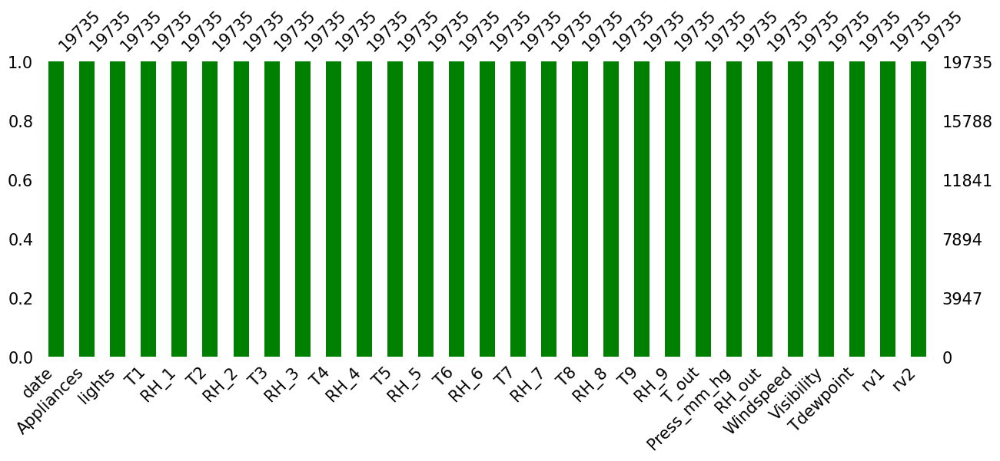

In [8]:
# Visualizing the missing values
msno.bar(df, color='green',sort='ascending', figsize=(15,5), fontsize=15)

In [9]:
# Dataset Duplicate Value Count
df.duplicated().sum()

np.int64(0)

* The dataset provided contains 29 columns and 19735 rows and does not have any missing or duplicate values.


* The goal is to predict the energy use of appliances. Demand prediction involves analytical studies on the probability of house temperature and humidity conditions, which were monitored with a ZigBee wireless sensor network for 10 minutes for about 4.5 months.

* There are no duplicate columns

* There are no missing values

In [10]:
#  Statistical Summary (Descriptive Stats)
df.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,19.592106,50.949283,7.910939,54.609083,20.267106,35.388200,22.029107,42.936165,19.485828,41.552401,7.412580,755.522602,79.750418,4.039752,38.330834,3.760995,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,1.844623,9.022034,6.090347,31.149806,2.109993,5.114208,1.956162,5.224361,2.014712,4.151497,5.318464,7.399441,14.901088,2.451221,11.794719,4.195248,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,15.330000,29.815000,-6.065000,1.000000,15.390000,23.200000,16.306667,29.600000,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,18.277500,45.400000,3.626667,30.025000,18.700000,31.500000,20.790000,39.066667,18.000000,38.500000,3.670000,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,19.390000,49.090000,7.300000,55.290000,20.033333,34.863333,22.100000,42.375000,19.390000,40.900000,6.920000,756.100000,83.666667,3.666667,40.000000,3.430000,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,20.619643,53.663333,11.256000,83.226667,21.600000,39.000000,23.390000,46.536000,20.600000,44.338095,10.400000,760.933333,91.666667,5.500000,40.000000,6.570000,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,25.795000,96.321667,28.290000,99.900000,26.000000,51.400000,27.230000,58.780000,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


In [11]:
# Check Unique Values for each variable.
for col in df.columns:
    print(f"No of unique values {col} is {df[col].nunique()}")

No of unique values date is 19735
No of unique values Appliances is 92
No of unique values lights is 8
No of unique values T1 is 722
No of unique values RH_1 is 2547
No of unique values T2 is 1650
No of unique values RH_2 is 3376
No of unique values T3 is 1426
No of unique values RH_3 is 2618
No of unique values T4 is 1390
No of unique values RH_4 is 2987
No of unique values T5 is 2263
No of unique values RH_5 is 7571
No of unique values T6 is 4446
No of unique values RH_6 is 9708
No of unique values T7 is 1955
No of unique values RH_7 is 5891
No of unique values T8 is 2228
No of unique values RH_8 is 6649
No of unique values T9 is 924
No of unique values RH_9 is 3388
No of unique values T_out is 1055
No of unique values Press_mm_hg is 2189
No of unique values RH_out is 566
No of unique values Windspeed is 189
No of unique values Visibility is 412
No of unique values Tdewpoint is 1118
No of unique values rv1 is 19735
No of unique values rv2 is 19735


In [12]:
# Changing the data format of date column
df["date"]=pd.to_datetime(df["date"],dayfirst=True)
df['hour']=df['date'].dt.hour
df['day']=df['date'].dt.day
df['month']=df['date'].dt.month
df['weekday']=df['date'].dt.weekday

In [13]:
#drop the date column
df.drop('date',axis=1,inplace=True)

In [14]:
#separate column list for better analysis
temp_cols=['T1','T2','T3','T4','T5','T6','T7','T8','T9','T_out']
hu_cols = ['RH_1','RH_2','RH_3','RH_4','RH_5','RH_6','RH_7','RH_8','RH_9','RH_out']
weather_cols = ['T_out','Press_mm_hg','RH_out','Windspeed','Visibility','Tdewpoint']
random_col = ['rv1', 'rv2']
light_cols=['lights']
date_col = ['month','weekday','hour']

## EDA Visualization 

## Distribution of Appliance Energy Consumption

This visualization shows the distribution of the target variable (Appliances). Understanding the distribution helps identify skewness, outliers, and the need for data transformation before model building.

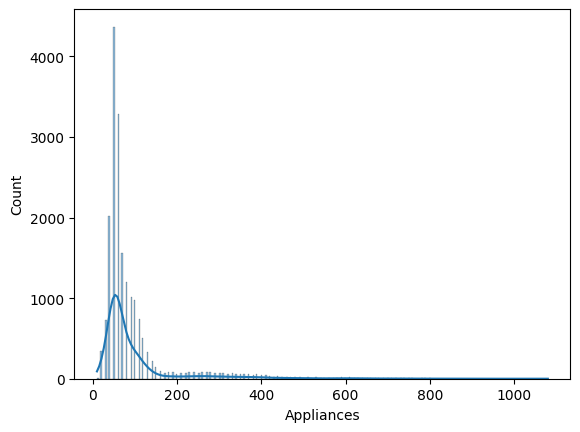

In [15]:
sns.histplot(df['Appliances'], kde=True)
plt.show()

## Distribution After Log Transformation

Log transformation is applied to reduce skewness and minimize the impact of extreme values. The transformed distribution is analyzed to determine whether the target variable becomes more suitable for machine learning models.

<Axes: xlabel='Appliances', ylabel='Count'>

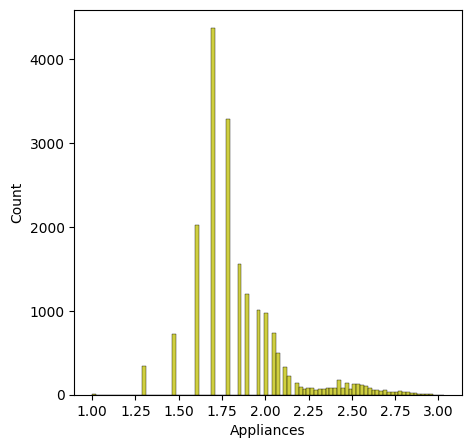

In [16]:
plt.figure(figsize=(5,5))
sns.histplot(np.log10(df['Appliances']),color='y')

## Distribution Analysis of Temperature Features

This analysis examines the distribution of all temperature-related variables in the dataset. Histograms are used to visualize the spread of temperature values, while the mean and median lines help identify the central tendency and potential skewness in each feature.

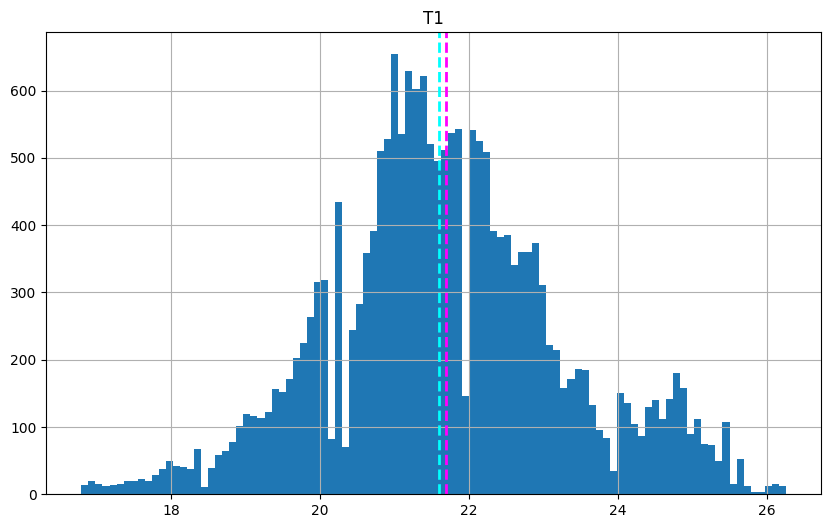

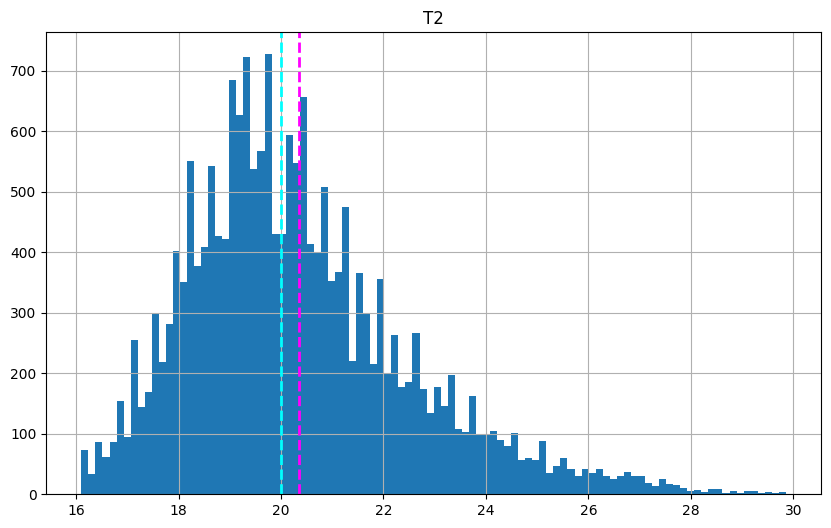

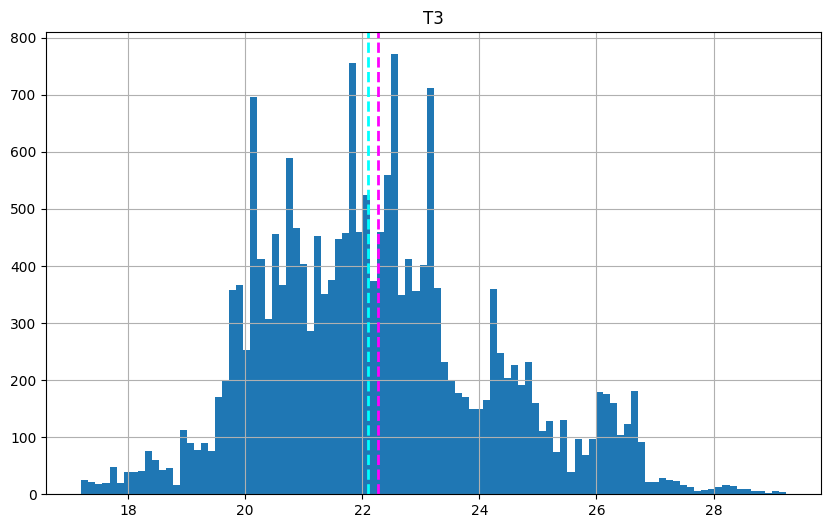

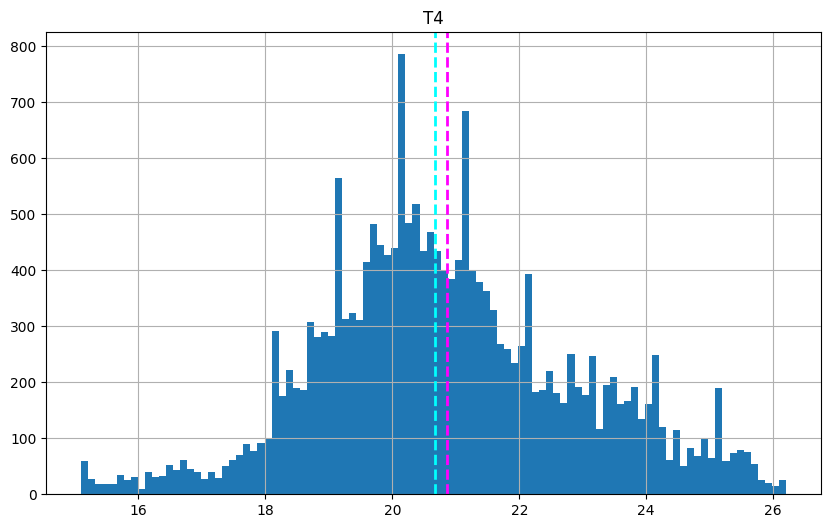

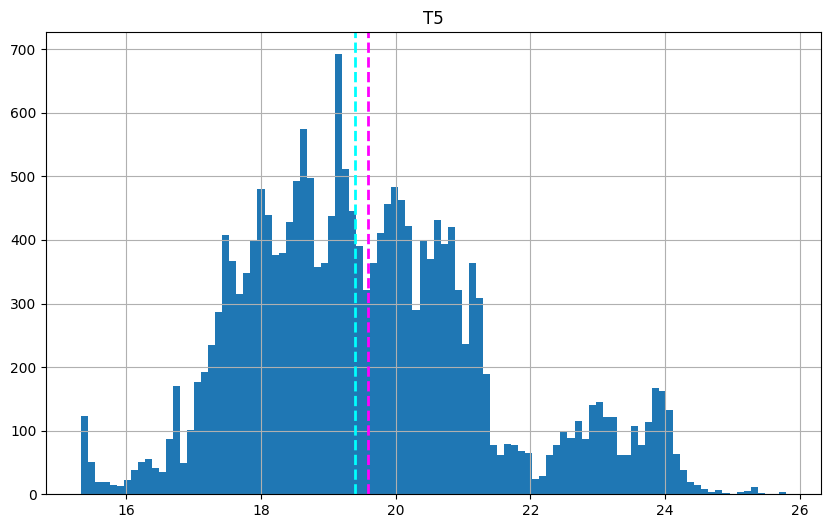

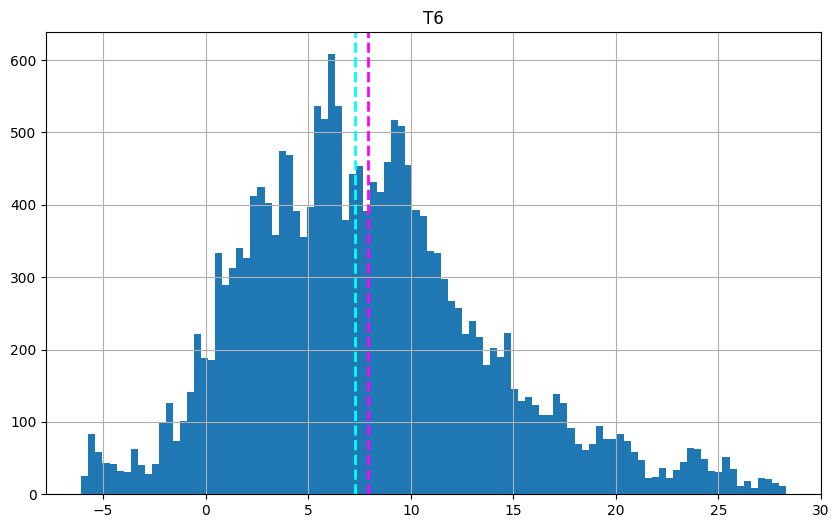

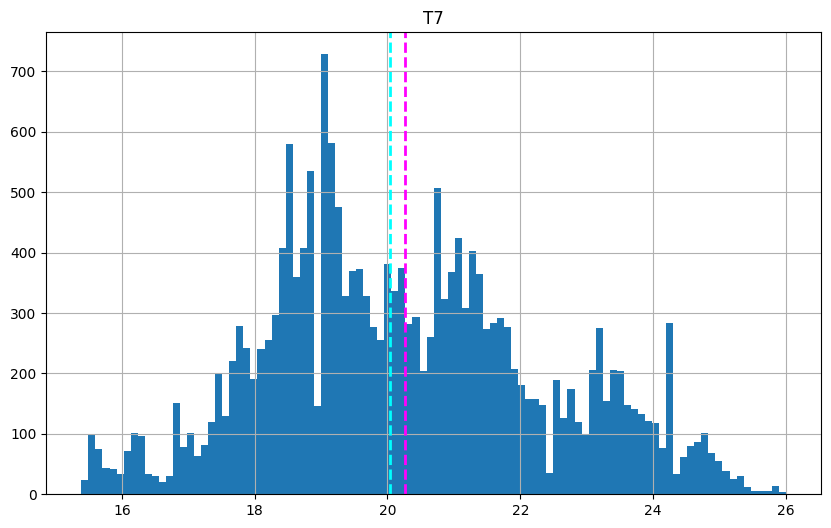

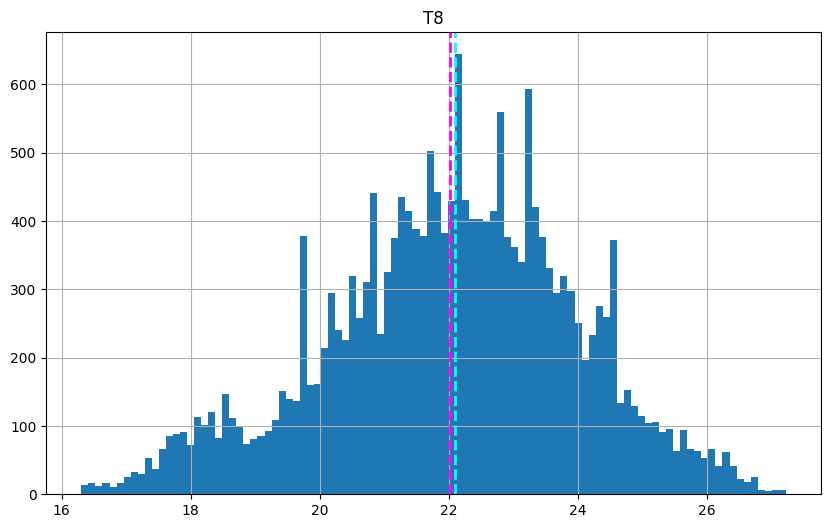

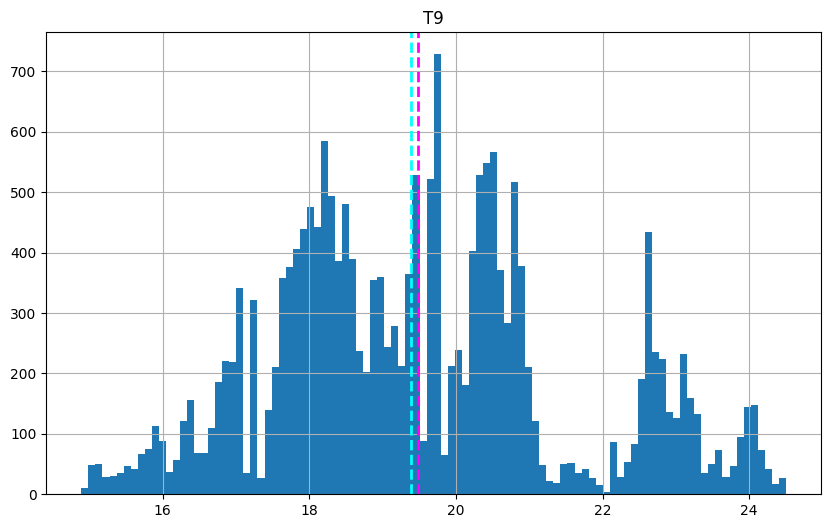

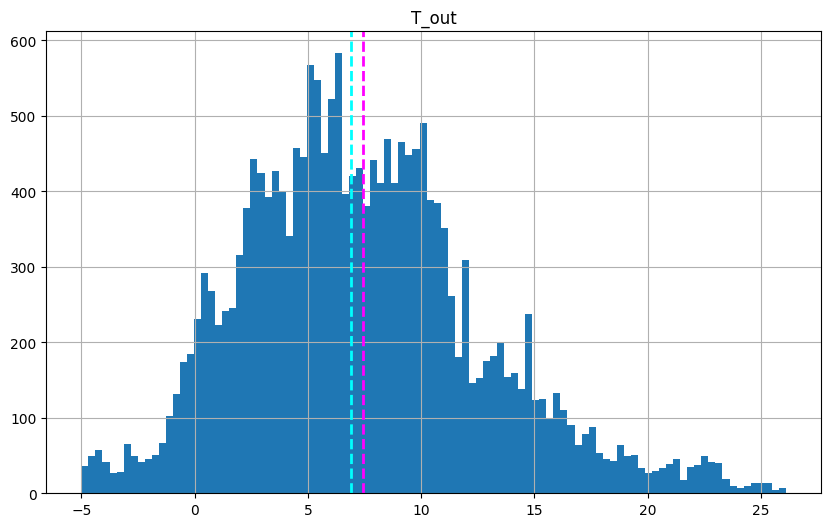

In [17]:
for col in temp_cols:
    fig =plt.figure(figsize=(10,6))
    ax =fig.gca()
    feature=(df[col])
    feature.hist(bins=100,ax=ax)
    ax.axvline(df[col].mean(),color='magenta',linestyle='dashed',linewidth=2)
    ax.axvline(feature.median(),color='cyan',linestyle='dashed',linewidth=2)
    ax.set_title(col)
plt.show()

## Temperature Distribution and Relationship with Appliance Energy Consumption

This analysis examines the distribution of temperature-related features and their relationship with appliance energy consumption. Histograms with mean and median lines are used to understand the distribution of each temperature feature, while line plots help visualize how appliance energy consumption varies with changes in temperature.

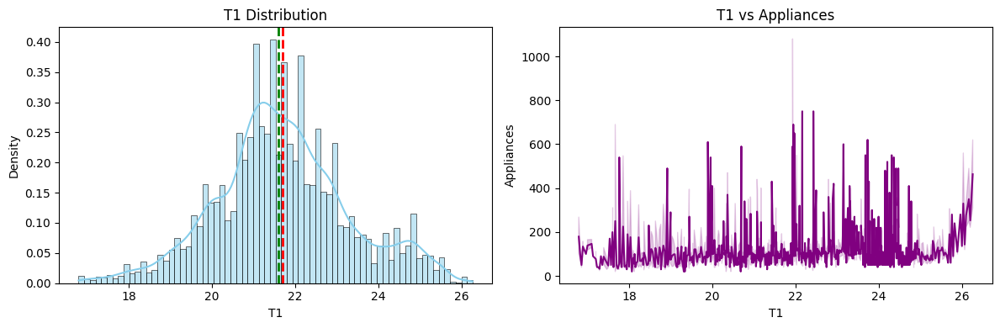

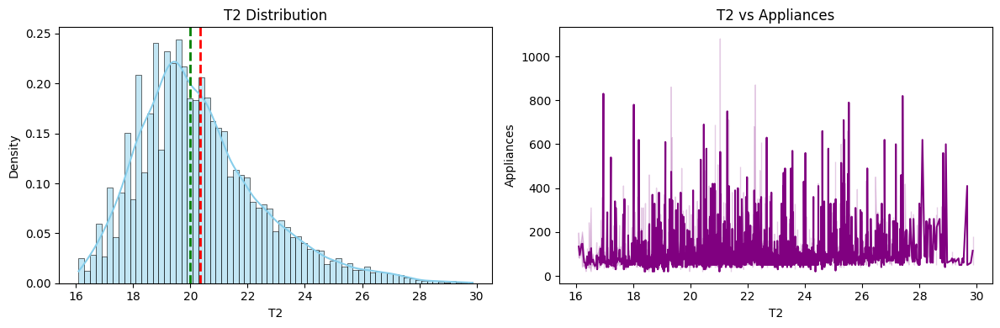

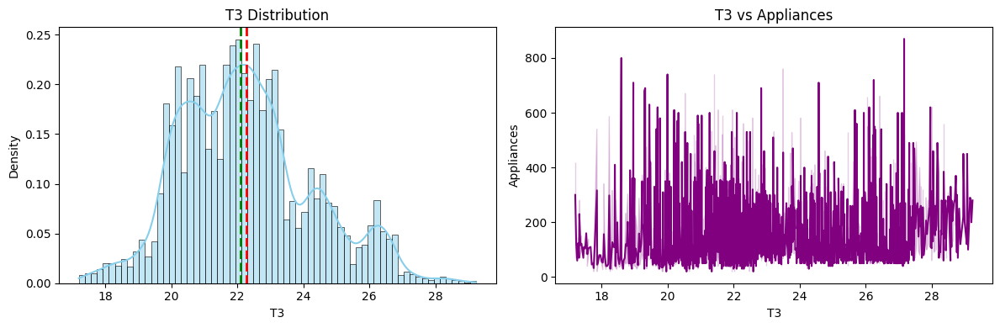

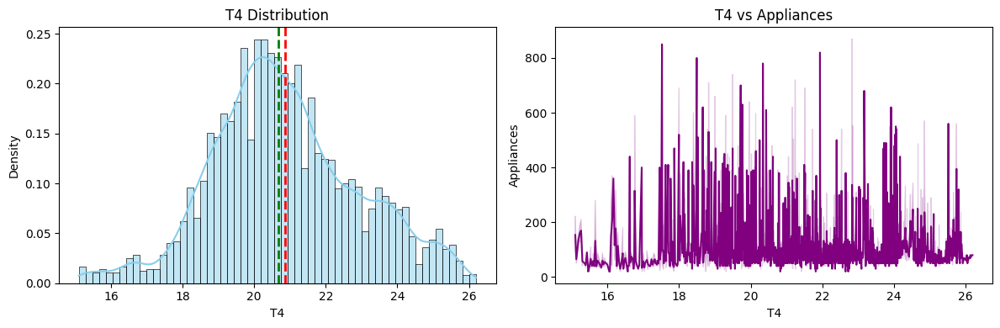

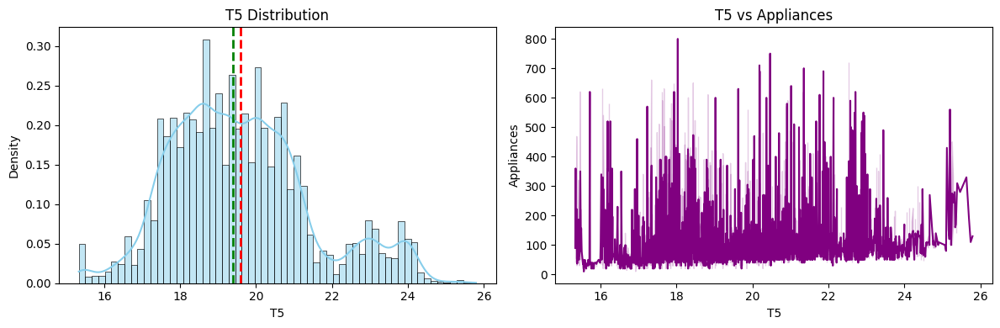

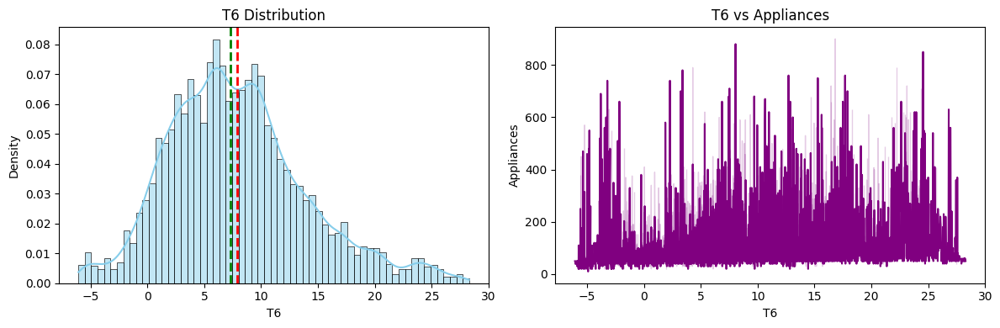

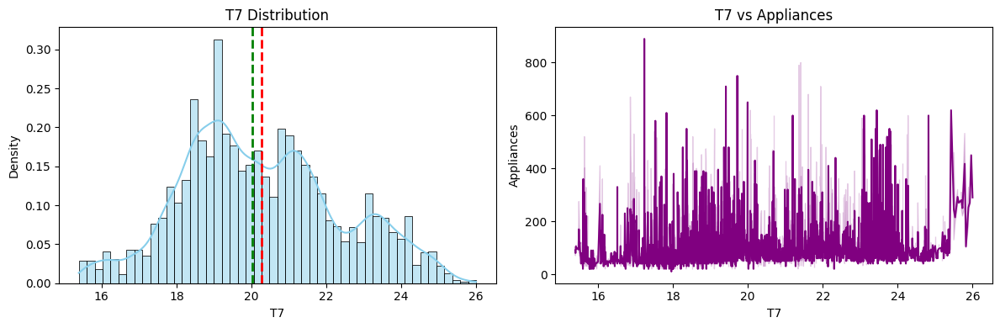

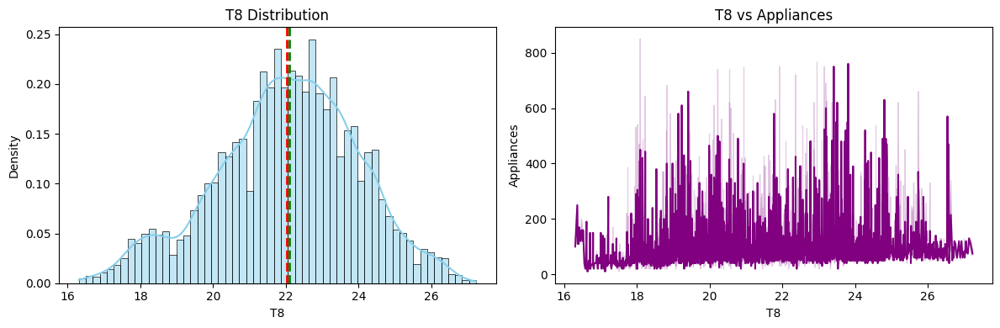

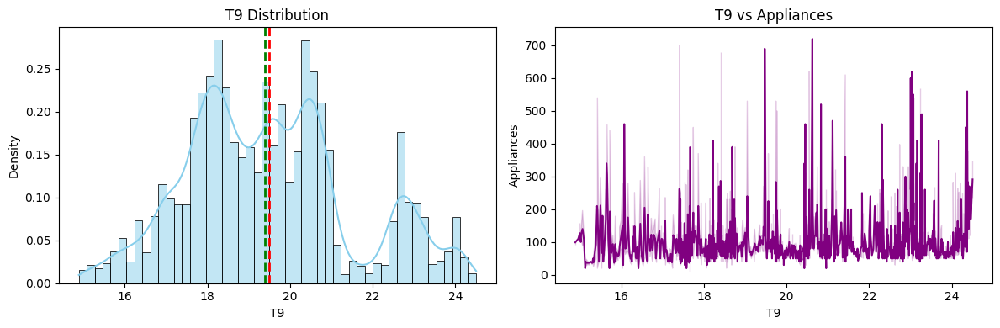

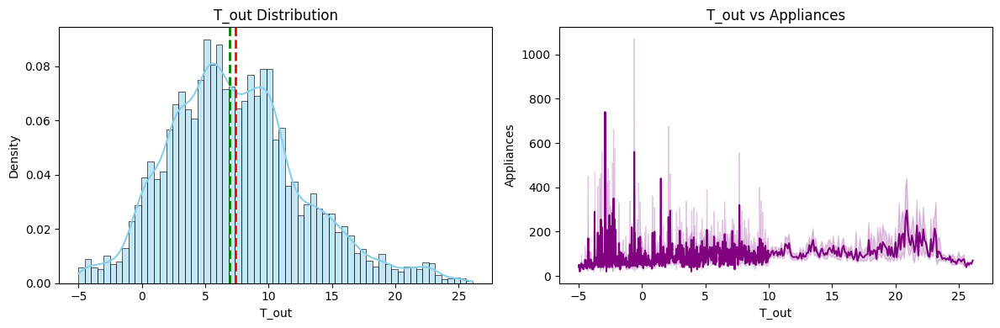

In [18]:
for feature in temp_cols:

    plt.figure(figsize=(12,4))

    # Distribution Plot
    plt.subplot(1,2,1)

    sns.histplot(
        df[feature],
        kde=True,
        stat='density',
        color='skyblue'
    )

    # Mean and Median Lines
    plt.axvline(
        df[feature].mean(),
        color='red',
        linestyle='--',
        linewidth=2
    )

    plt.axvline(
        df[feature].median(),
        color='green',
        linestyle='--',
        linewidth=2
    )

    plt.ylabel("Density")
    plt.title(f'{feature} Distribution')

    # Line Plot
    plt.subplot(1,2,2)

    sns.lineplot(
        data=df,
        x=feature,
        y='Appliances',
        color='purple'
    )

    plt.title(f'{feature} vs Appliances')

    plt.tight_layout()
    plt.show()

## Humidity Distribution and Relationship with Appliance Energy Consumption

This analysis examines the distribution of humidity-related features and their relationship with appliance energy consumption. Histograms are used to understand the distribution, central tendency, and spread of humidity variables, while scatter plots help visualize how appliance energy consumption varies with changes in humidity levels.

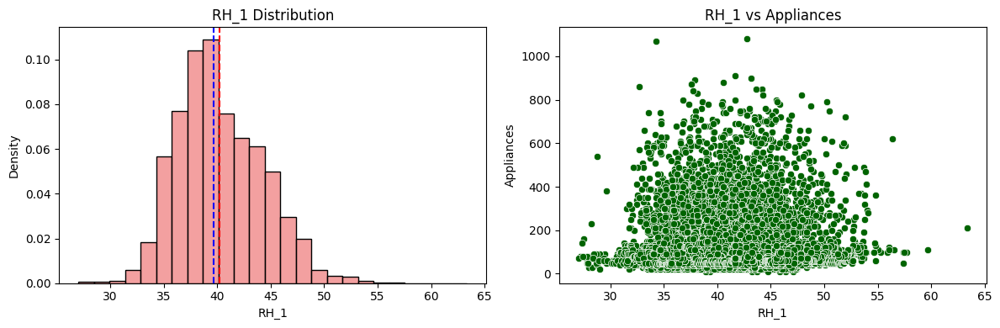

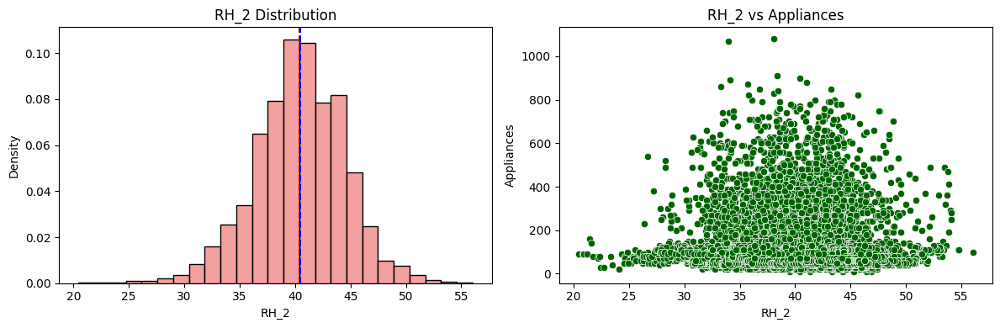

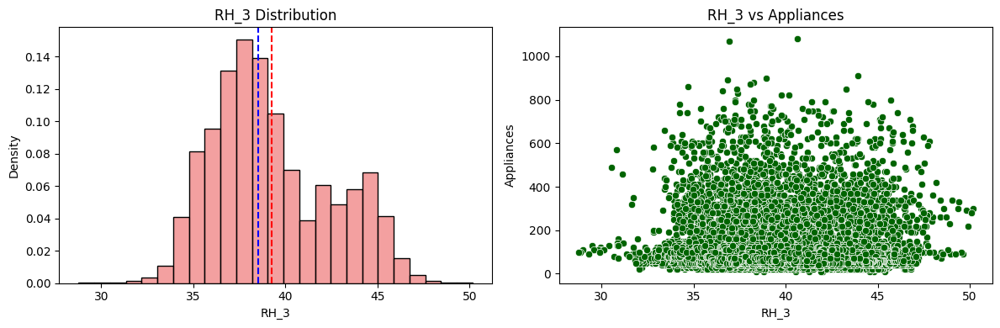

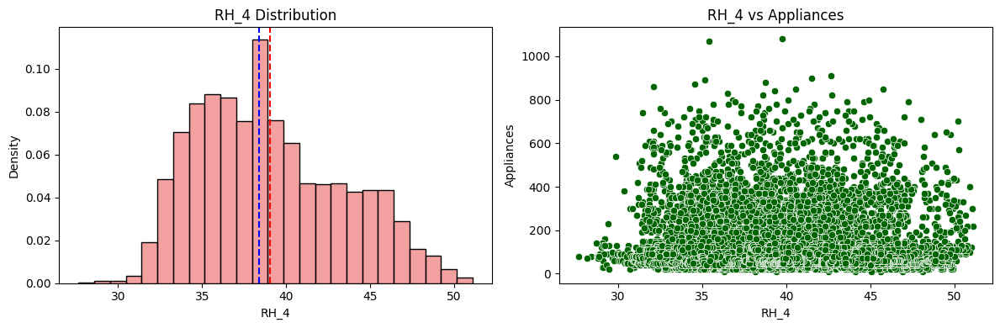

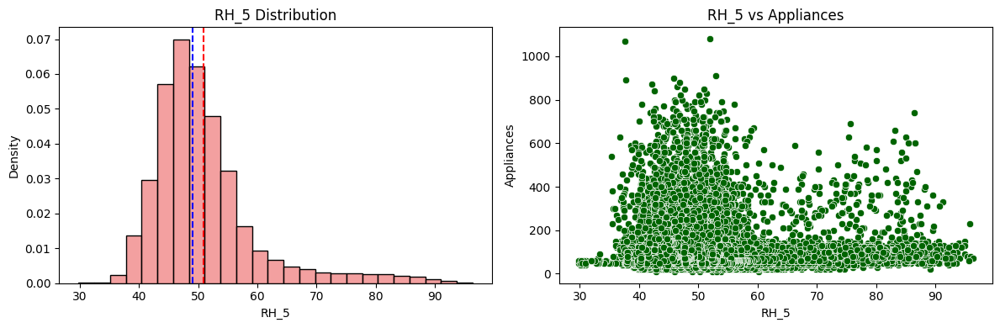

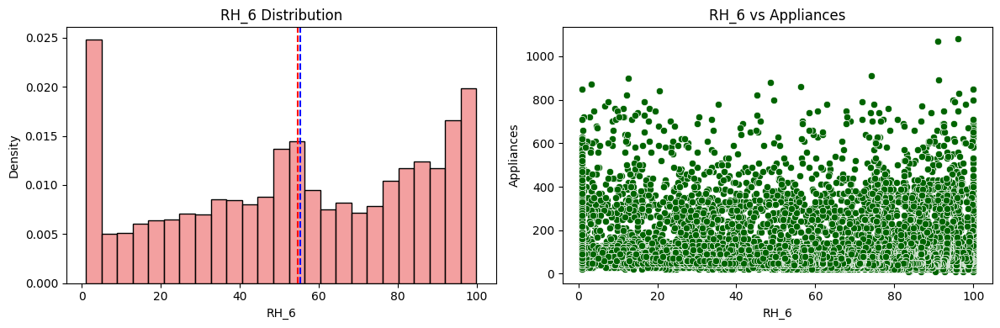

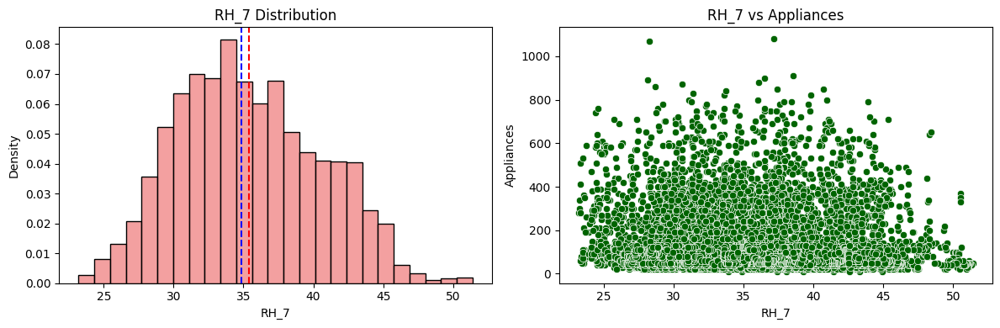

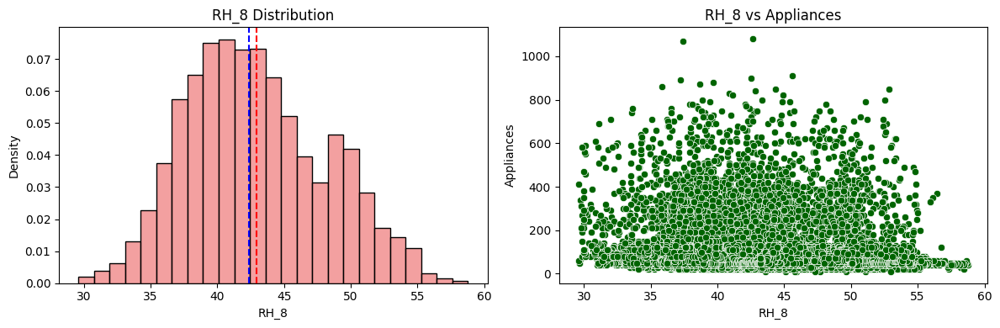

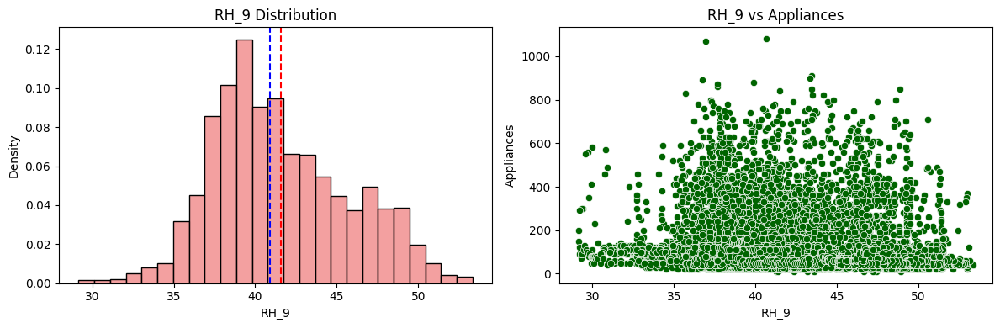

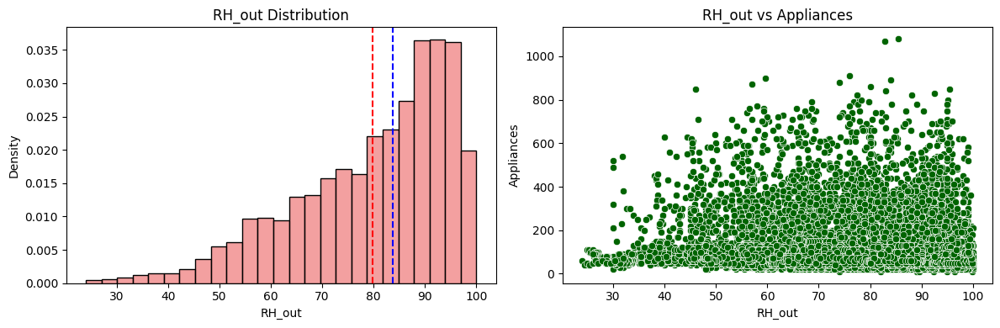

In [19]:
for feature in hu_cols:

    plt.figure(figsize=(12,4))

    plt.subplot(1,2,1)

    sns.histplot(
        df[feature],
        stat='density',
        bins=25,
        color='lightcoral'
    )

    plt.axvline(df[feature].mean(), color='red', linestyle='--')
    plt.axvline(df[feature].median(), color='blue', linestyle='--')

    plt.ylabel("Density")
    plt.title(f'{feature} Distribution')

    plt.subplot(1,2,2)

    sns.scatterplot(
        data=df,
        x=feature,
        y='Appliances',
        color='darkgreen'
    )

    plt.title(f'{feature} vs Appliances')

    plt.tight_layout()
    plt.show()

## Weather Features Distribution and Their Impact on Appliance Energy Consumption

This analysis explores the distribution of weather-related features and their relationship with appliance energy consumption. Histograms are used to understand the distribution and central tendency of weather variables, while regression plots help visualize the trend and strength of the relationship between weather conditions and appliance energy usage.

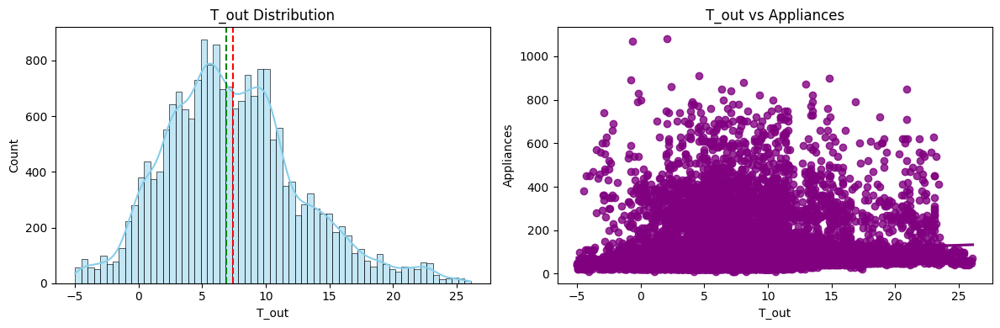

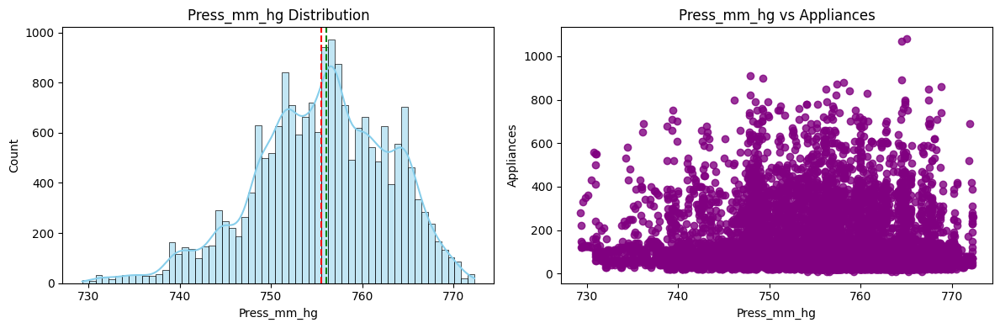

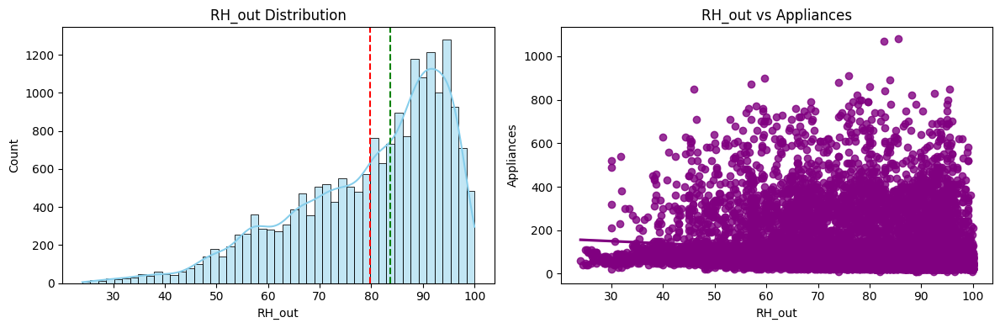

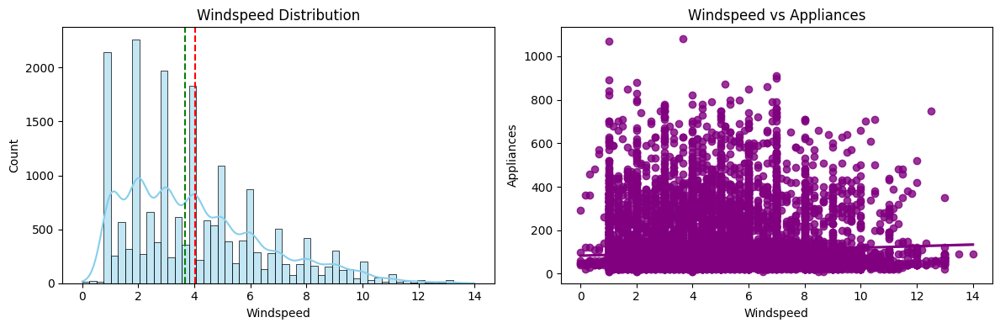

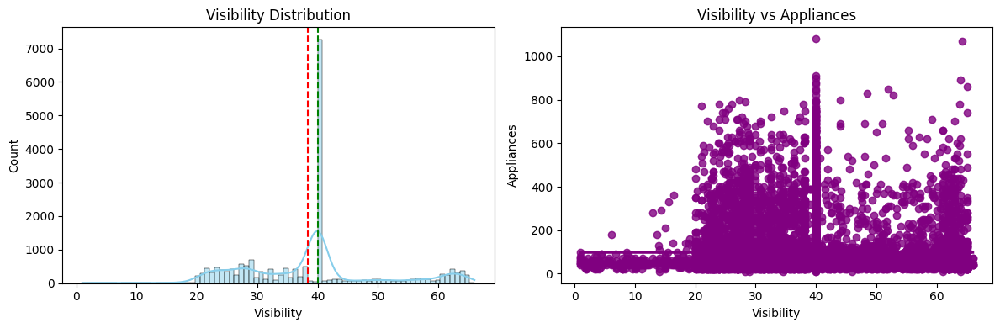

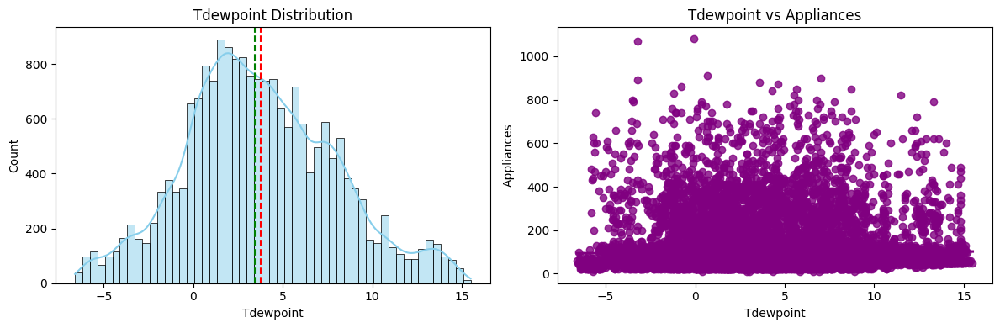

In [20]:
for col in weather_cols:

    plt.figure(figsize=(12,4))

    # Distribution Plot
    plt.subplot(1,2,1)

    sns.histplot(df[col], kde=True, color='skyblue')

    plt.axvline(df[col].mean(),
                color='red',
                linestyle='--')

    plt.axvline(df[col].median(),
                color='green',
                linestyle='--')

    plt.title(f'{col} Distribution')

    # Relationship with Appliances
    plt.subplot(1,2,2)

    sns.regplot(
        data=df,
        x=col,
        y='Appliances',
        color='purple'
    )

    plt.title(f'{col} vs Appliances')

    plt.tight_layout()
    plt.show()

## Analysis of Lighting Energy Consumption

This analysis explores the distribution of lighting energy consumption (lights) and its relationship with appliance energy consumption. The distribution plot helps understand the spread and central tendency of lighting usage, while the scatter plot is used to examine whether lighting consumption influences appliance energy consumption.

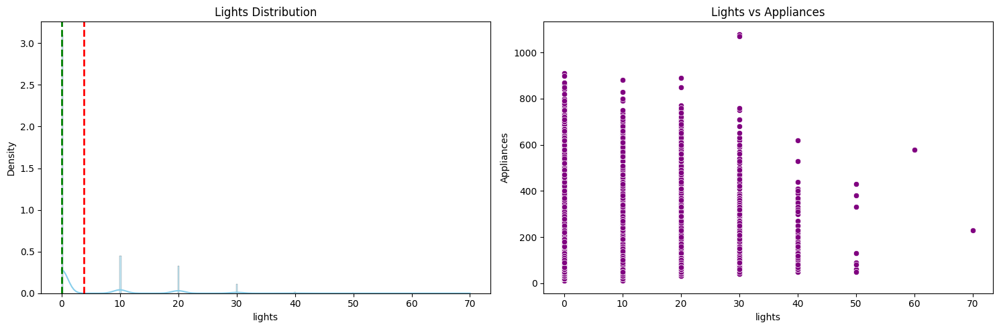

In [21]:
fig, ax = plt.subplots(1, 2, figsize=(15,5))

# Distribution Plot
sns.histplot(
    df['lights'],
    kde=True,
    stat='density',
    color='skyblue',
    ax=ax[0]
)

ax[0].axvline(
    df['lights'].mean(),
    color='red',
    linestyle='--',
    linewidth=2
)

ax[0].axvline(
    df['lights'].median(),
    color='green',
    linestyle='--',
    linewidth=2
)

ax[0].set_title('Lights Distribution')

# Relationship with Appliances
sns.scatterplot(
    data=df,
    x='lights',
    y='Appliances',
    color='purple',
    ax=ax[1]
)

ax[1].set_title('Lights vs Appliances')

plt.tight_layout()
plt.show()

## Analysis of Random Variables

This analysis explores the distribution of randomly generated variables and their relationship with appliance energy consumption. Histograms are used to understand the distribution and central tendency of these variables, while line plots help examine whether they have any meaningful relationship with the target variable (Appliances).

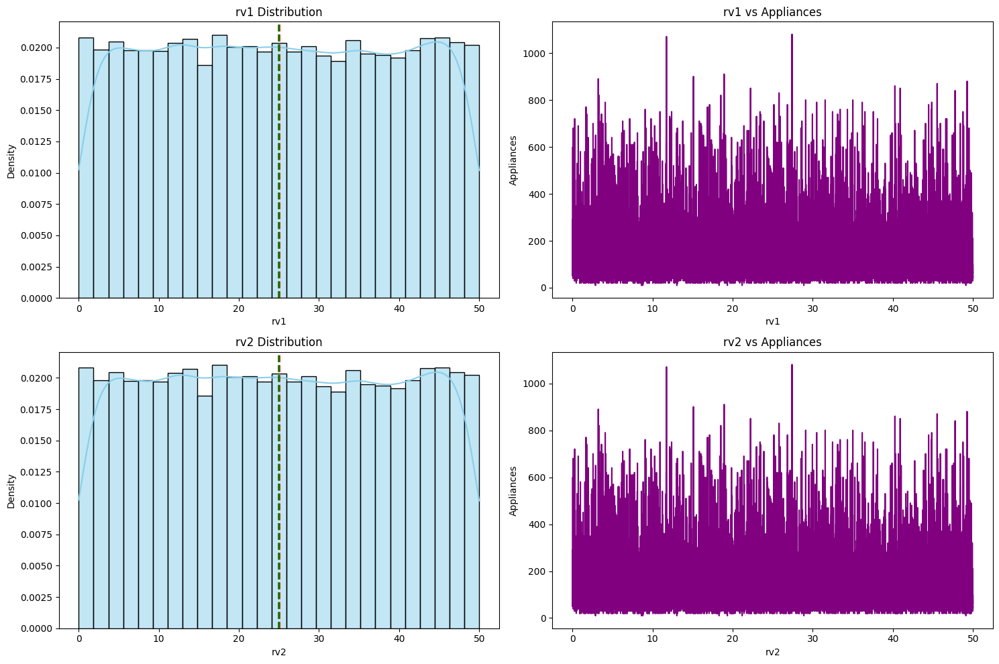

In [22]:
fig, ax = plt.subplots(len(random_col), 2, figsize=(15,10))

for i, col in enumerate(random_col):

    # Distribution Plot
    sns.histplot(
        df[col],
        kde=True,
        stat='density',
        color='skyblue',
        ax=ax[i,0]
    )

    ax[i,0].axvline(
        df[col].mean(),
        color='red',
        linestyle='--',
        linewidth=2
    )

    ax[i,0].axvline(
        df[col].median(),
        color='green',
        linestyle='--',
        linewidth=2
    )

    ax[i,0].set_title(f'{col} Distribution')

    # Relationship with Appliances
    sns.lineplot(
        data=df,
        x=col,
        y='Appliances',
        color='purple',
        ax=ax[i,1]
    )

    ax[i,1].set_title(f'{col} vs Appliances')

plt.tight_layout()
plt.show()

## Correlation Analysis

Correlation analysis is performed to understand the relationship between different variables in the dataset. The correlation heatmap helps identify positively and negatively correlated features, detect multicollinearity, and determine which variables are strongly associated with appliance energy consumption.

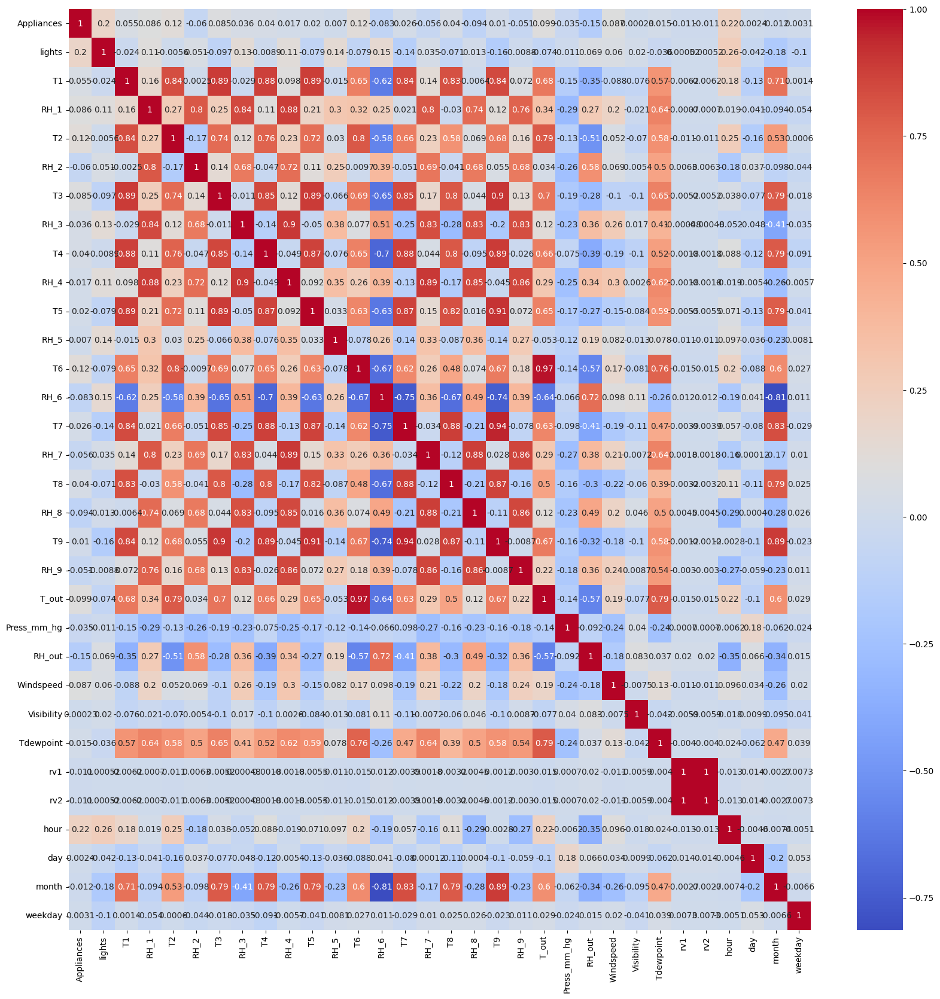

In [23]:
corr_matrix = df.corr()

# create the heatmap with a larger size
plt.figure(figsize=(20, 20))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True)

# show the plot
plt.show()

In [24]:
# Calculate correlation between temperature features and appliance energy consumption
for col in temp_cols[:]:
    feature=df[col]
    label=df['Appliances']
    correlation=feature.corr(label)
    print('the corelation of',col,'with Appliances is',correlation)

the corelation of T1 with Appliances is 0.05544747184893993
the corelation of T2 with Appliances is 0.12007328290071968
the corelation of T3 with Appliances is 0.08505990237184806
the corelation of T4 with Appliances is 0.04028098301136273
the corelation of T5 with Appliances is 0.019759860600457577
the corelation of T6 with Appliances is 0.11763768941915256
the corelation of T7 with Appliances is 0.025801044629161156
the corelation of T8 with Appliances is 0.039571981102693415
the corelation of T9 with Appliances is 0.010010284642014942
the corelation of T_out with Appliances is 0.09915468001453942


In [25]:
# Calculate correlation between humidity features and appliance energy consumption
for col in hu_cols[:]:
    feature=df[col]
    label=df['Appliances']
    correlation=feature.corr(label)
    print('the corelation of',col,'with Appliances is',correlation)

the corelation of RH_1 with Appliances is 0.08603142531724414
the corelation of RH_2 with Appliances is -0.06046476003153639
the corelation of RH_3 with Appliances is 0.036291721154280636
the corelation of RH_4 with Appliances is 0.01696543141766893
the corelation of RH_5 with Appliances is 0.006954536263988954
the corelation of RH_6 with Appliances is -0.08317760704198537
the corelation of RH_7 with Appliances is -0.055642418331685324
the corelation of RH_8 with Appliances is -0.09403862708021302
the corelation of RH_9 with Appliances is -0.05146201134731546
the corelation of RH_out with Appliances is -0.15228238090949958


In [26]:
# Calculate correlation between weather features and appliance energy consumption
for col in weather_cols[:]:
    feature=df[col]
    label=df['Appliances']
    correlation=feature.corr(label)
    print('the corelation of',col,'with Appliances is',correlation)

the corelation of T_out with Appliances is 0.09915468001453942
the corelation of Press_mm_hg with Appliances is -0.03488482908469833
the corelation of RH_out with Appliances is -0.15228238090949958
the corelation of Windspeed with Appliances is 0.08712210591289257
the corelation of Visibility with Appliances is 0.0002303578553643724
the corelation of Tdewpoint with Appliances is 0.015356636108064743


## Pair Plot of Temperature Columns

<Figure size 2500x2500 with 0 Axes>

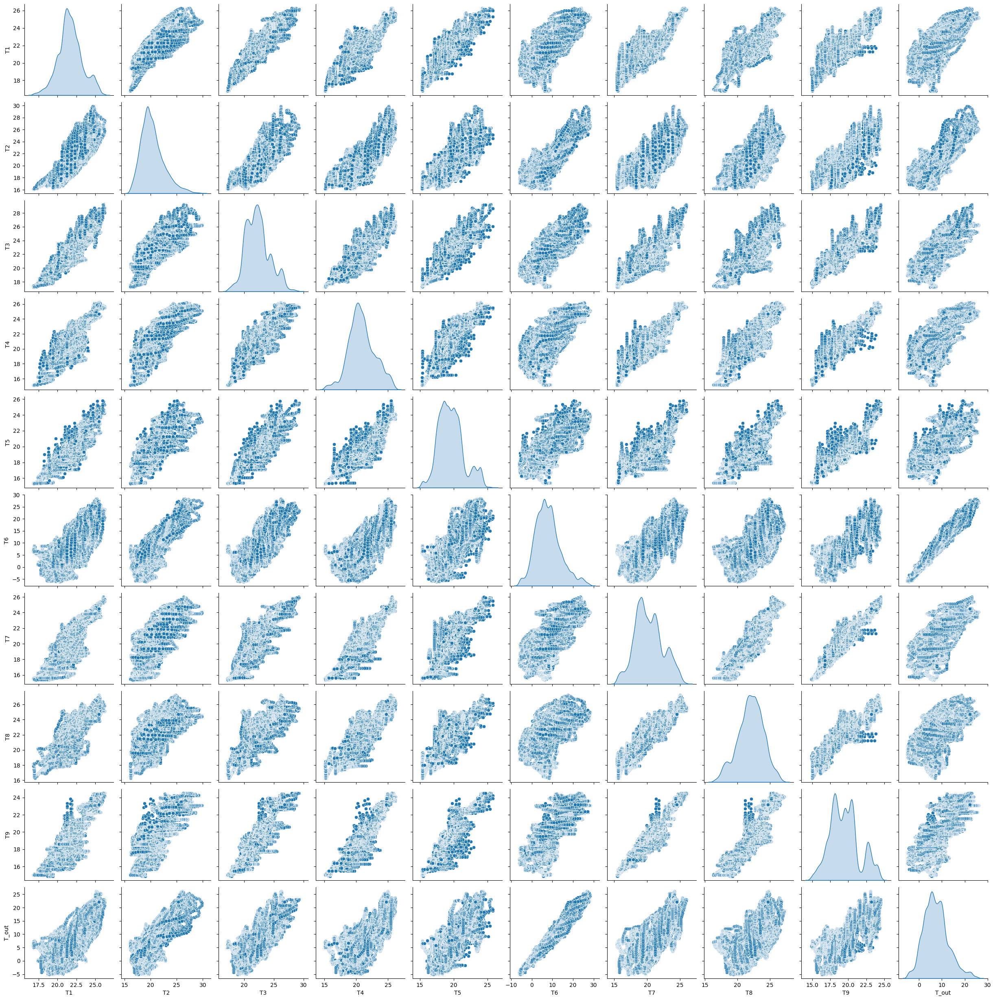

In [27]:
plt.figure(figsize=(25,25))
pair=sns.pairplot(df[temp_cols], diag_kind='kde')
plt.show()

## Pair Plot of Humidity Columns

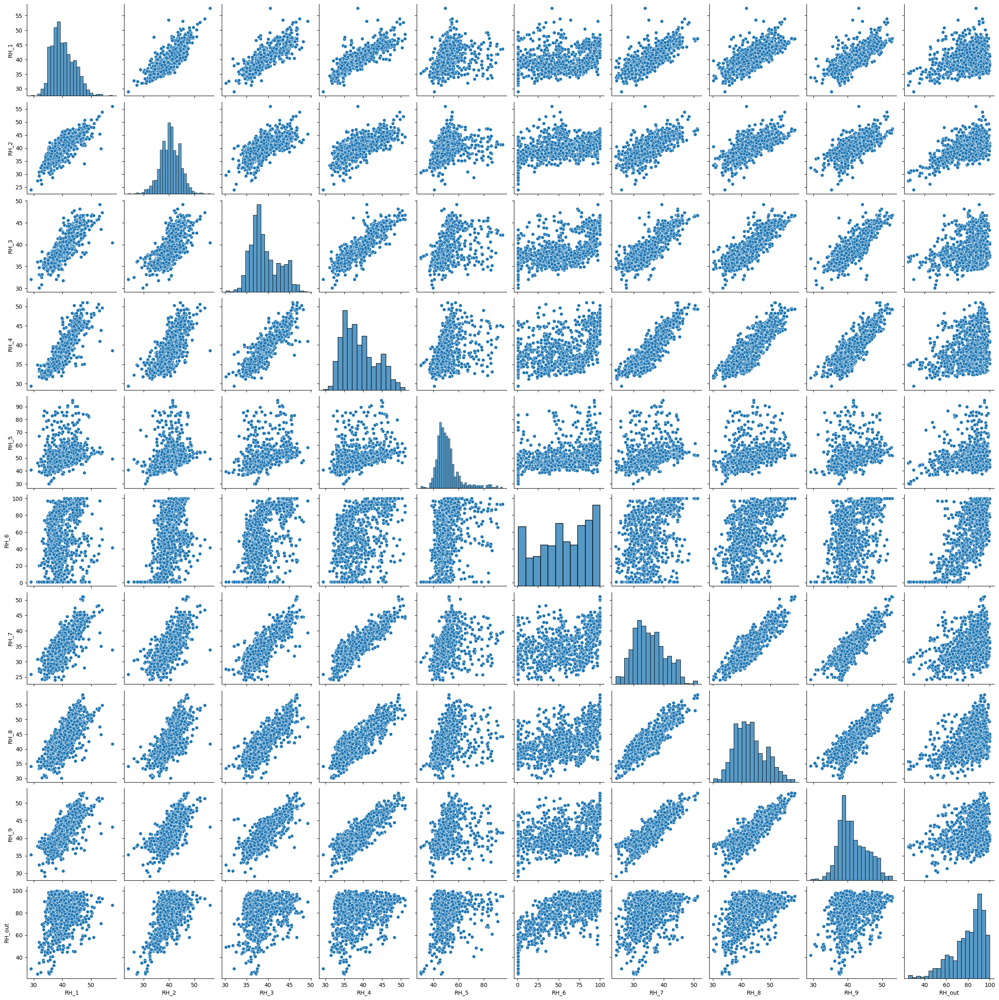

In [28]:
sns.pairplot(
    df[hu_cols].sample(1000, random_state=42),
    diag_kind='hist'
)

plt.show()

## Pair Plot of Weather Columns

<Figure size 2500x2500 with 0 Axes>

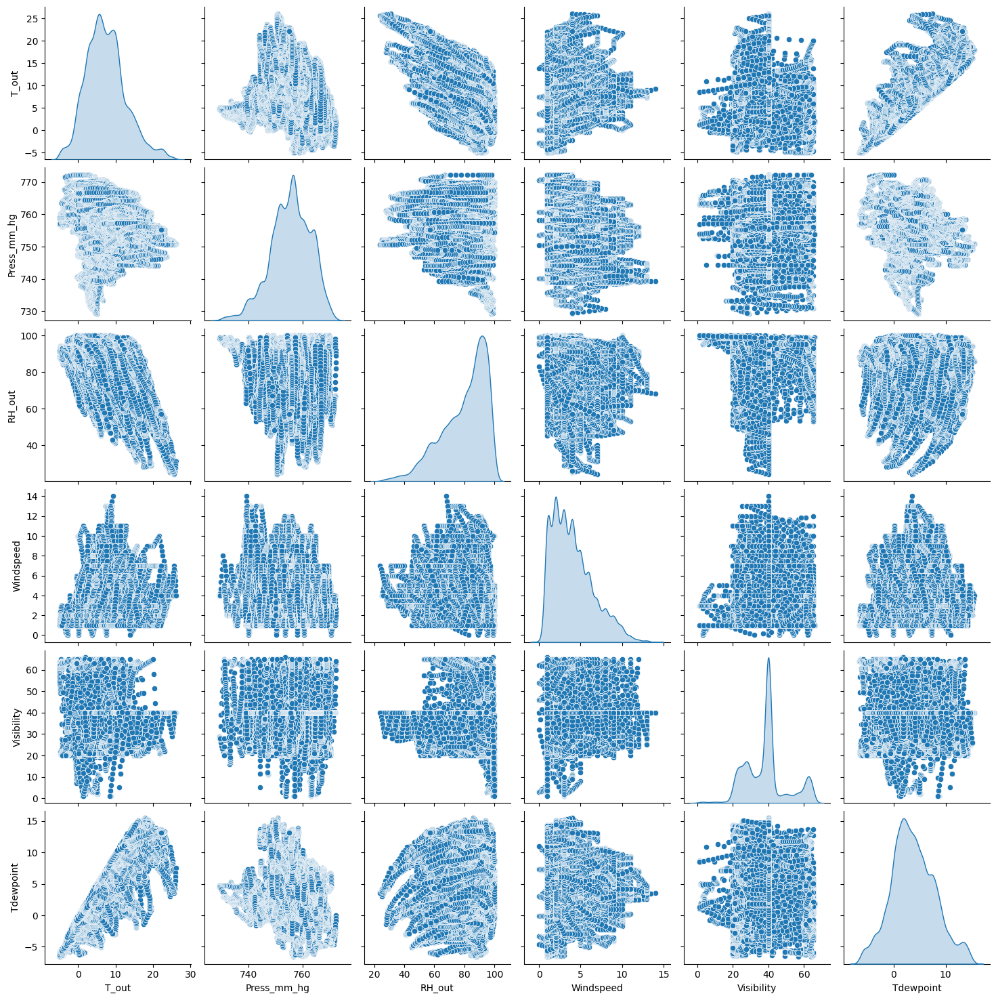

In [29]:
plt.figure(figsize=(25,25))
pair=sns.pairplot(df[weather_cols], diag_kind='kde')
plt.show()

## Hypothesis Testing

In [30]:
# Perform Statistical Test to obtain P-Value
data_weekday = df[df['weekday'] <= 5][['Appliances']]
data_weekend = df[df['weekday'] > 5][['Appliances']]

#Statistics Test and P-value
t_stat, p_val = stats.ttest_ind(data_weekday, data_weekend, equal_var=True)

print('T-Statistics value', t_stat)
print("P-Value", p_val)

T-Statistics value [1.52771504]
P-Value [0.12659933]


In [31]:
data_weekend

,Appliances
762,30
763,40
764,50
765,60
766,50
...,...
19045,60
19046,60
19047,60
19048,60


In [32]:
data_month_1=df[df['month']==1][['Appliances']]
data_month_2=df[df['month']==2][['Appliances']]
data_month_3=df[df['month']==3][['Appliances']]
data_month_4=df[df['month']==4][['Appliances']]
data_month_5=df[df['month']==5][['Appliances']]
t_stat,p_val=stats.ttest_ind(data_month_1,data_month_4,equal_var=True)
print('T-Statistics value', t_stat)
print("P-Value", p_val)

T-Statistics value [-0.69439425]
P-Value [0.48745728]


## OUTLIER HANNDLING USING IOR METHOD

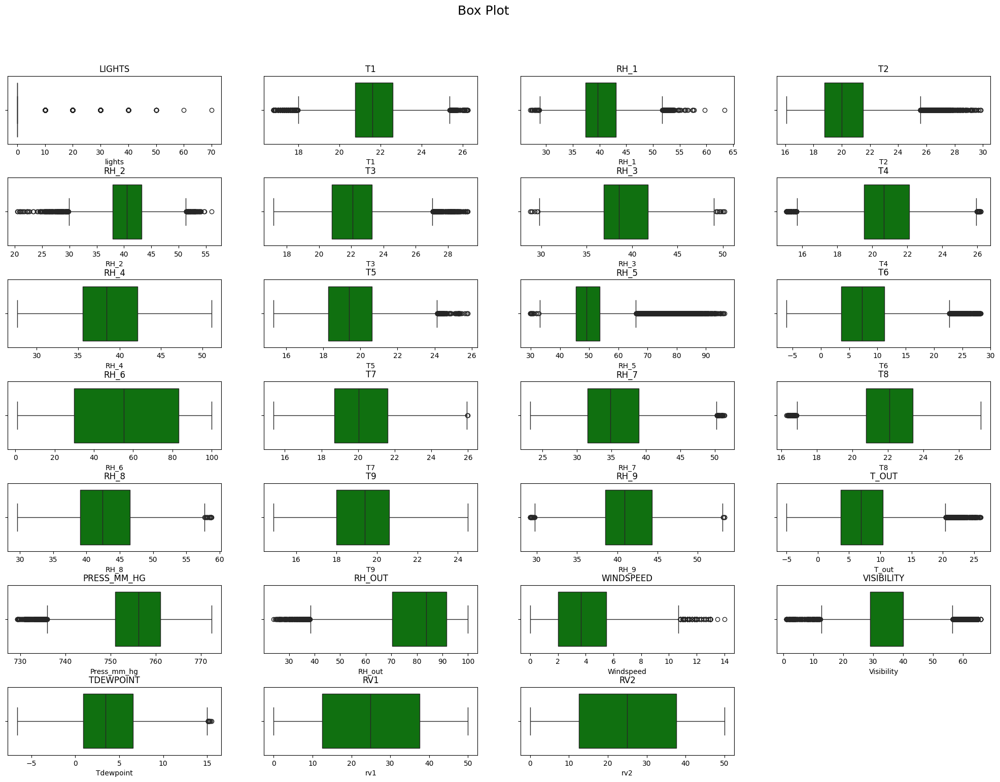

In [33]:
col_list = [col for col in df.columns
            if col not in ['Appliances','hour','day','month','weekday']]
plt.figure(figsize=(25, 20))
plt.suptitle("Box Plot", fontsize=18, y=0.95)

for n, ticker in enumerate(col_list):

    ax = plt.subplot(8, 4, n + 1)

    plt.subplots_adjust(hspace=0.5, wspace=0.2)

    sns.boxplot(x=df[ticker],color='g', ax = ax)

    # chart formatting
    ax.set_title(ticker.upper())

In [34]:

for col in col_list:

    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)

    IQR = Q3 - Q1

    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    df[col] = np.where(df[col] > upper, upper, df[col])
    df[col] = np.where(df[col] < lower, lower, df[col])

print("Outlier treatment completed")

Outlier treatment completed


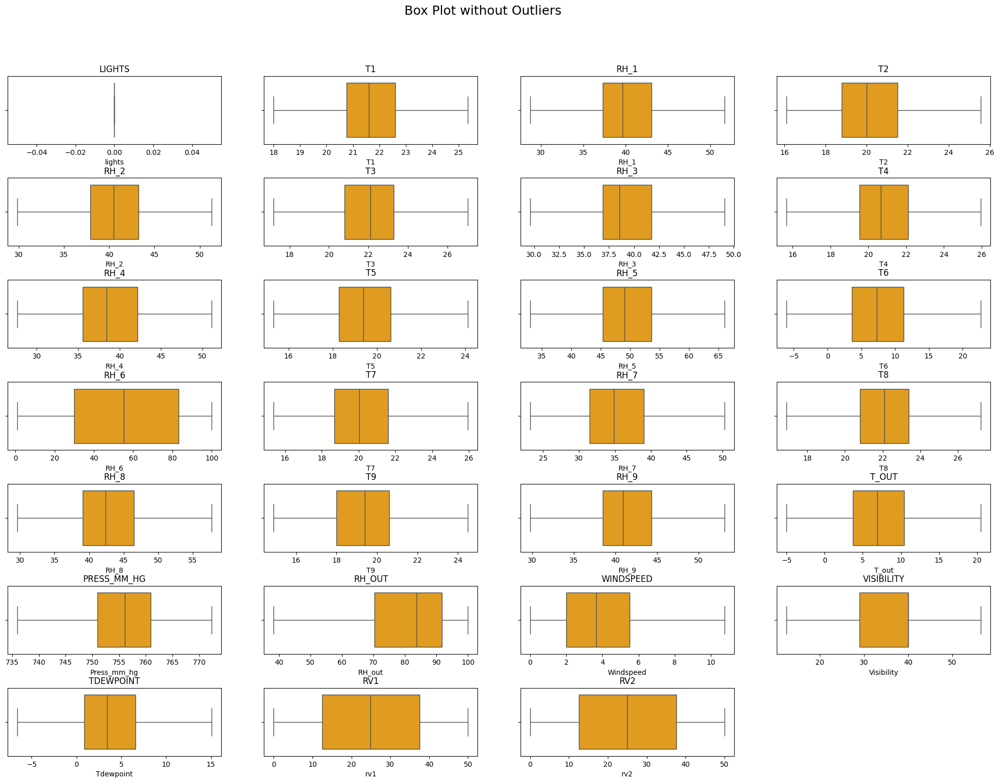

In [35]:
plt.figure(figsize=(25, 20))
plt.suptitle("Box Plot without Outliers", fontsize=18, y=0.95)
#plot the all figures in loop with boxplot
for n, ticker in enumerate(col_list):

    ax = plt.subplot(8, 4, n + 1)

    plt.subplots_adjust(hspace=0.5, wspace=0.2)

    sns.boxplot(x=df[ticker],color='orange' ,ax = ax)

    # chart formatting
    ax.set_title(ticker.upper())

In [36]:
## Drop irrelevant columns 
df.drop('rv1',axis=1,inplace=True)
df.drop('rv2',axis=1,inplace=True)
df.head()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,hour,day,month,weekday
0,60,0.0,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.60,735.933333,92.0,7.000000,56.500000,5.3,17,11,1,0
1,60,0.0,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.48,735.933333,92.0,6.666667,56.500000,5.2,17,11,1,0
2,50,0.0,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.37,735.933333,92.0,6.333333,55.333333,5.1,17,11,1,0
3,50,0.0,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.25,735.933333,92.0,6.000000,51.500000,5.0,17,11,1,0
4,60,0.0,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,17.000000,45.40,6.13,735.933333,92.0,5.666667,47.666667,4.9,17,11,1,0


### 4. Feature Manipulation 

In [37]:
# Average Temperature
df['Average_Temperature'] = df[
    ['T1','T2','T3','T4','T5','T6','T7','T8','T9']
].mean(axis=1)

# Indoor-Outdoor Temperature Difference
df['Temperature_Difference'] = abs(
    df['Average_Temperature'] - df['T_out']
)

# Average Humidity
df['Average_Humidity'] = df[
    ['RH_1','RH_2','RH_3','RH_4','RH_5',
     'RH_6','RH_7','RH_8','RH_9']
].mean(axis=1)

# Indoor-Outdoor Humidity Difference
df['Humidity_Difference'] = abs(
    df['Average_Humidity'] - df['RH_out']
)

## Checking Multicollinearity

In [38]:
#create a function to check multicolinearity
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [round(variance_inflation_factor(X.values, i),2) for i in range(X.shape[1])]

    return(vif)

In [39]:
#check multicolinearuty
calc_vif(df[[i for i in df.describe().columns if i not in ['Appliances']]]).sort_values(by='VIF',ascending=False)

,variables,VIF
1,T1,inf
2,RH_1,inf
3,T2,inf
4,RH_2,inf
5,T3,inf
6,RH_3,inf
7,T4,inf
8,RH_4,inf
9,T5,inf
10,RH_5,inf


In [40]:
calc_vif(df[[i for i in df.describe().columns if i not in ['Appliances','lights','T1','T2','T3','T4','T5','RH_1','RH_2','RH_3','RH_4','RH_5','T6','Average_Temperature']]]).sort_values(by='VIF',ascending=False)

,variables,VIF
18,Average_Humidity,inf
19,Humidity_Difference,inf
9,RH_out,inf
5,T9,2769.42
8,Press_mm_hg,2031.55
1,T7,1549.94
17,Temperature_Difference,1331.67
3,T8,972.11
6,RH_9,696.00
7,T_out,685.66


In [41]:
calc_vif(df[[i for i in df.describe().columns if i not in ['Appliances','lights','T1','T2','T3','T4','T5','RH_1','RH_2','RH_3','RH_4','RH_5','T6','Average_Temperature','Press_mm_hg','T9','Humidity_Difference','T7','RH_6']]]).sort_values(by='VIF',ascending=False)

,variables,VIF
14,Average_Humidity,928.52
1,T8,833.52
13,Temperature_Difference,668.53
3,RH_9,587.93
2,RH_8,546.57
5,RH_out,467.52
0,RH_7,446.25
4,T_out,250.84
11,month,64.59
8,Tdewpoint,33.70


In [42]:
# Select your features wisely to avoid overfitting
df_removed=df[[i for i in df.describe().columns if i not in ['lights','T1','T2','T3','T4','T5','RH_1','RH_2','RH_3','RH_4','RH_5','T6','Average_Temperature','Press_mm_hg','T9','Humidity_Difference','T7','RH_out','RH_8','hu_parent','temp_teen_room','hu_ironing_room','Temperature_difference','temp_out','Visibility']]]

df_removed.head()

,Appliances,RH_6,RH_7,T8,RH_9,T_out,Windspeed,Tdewpoint,hour,day,month,weekday,Temperature_Difference,Average_Humidity
0,60,84.256667,41.626667,18.2,45.53,6.60,7.000000,5.3,17,11,1,0,10.567407,50.910741
1,60,84.063333,41.560000,18.2,45.56,6.48,6.666667,5.2,17,11,1,0,10.669630,50.827222
2,50,83.156667,41.433333,18.2,45.50,6.37,6.333333,5.1,17,11,1,0,10.733704,50.628889
3,50,83.423333,41.290000,18.1,45.40,6.25,6.000000,5.0,17,11,1,0,10.817037,50.574815
4,60,84.893333,41.230000,18.1,45.40,6.13,5.666667,4.9,17,11,1,0,10.940741,50.732963


In [43]:
# Transform  data
df_removed['Appliances']=df_removed['Appliances'].apply(lambda x:np.log10(x+1))
df_removed['Windspeed']=df_removed['Windspeed'].apply(lambda x:np.log10(x+1))

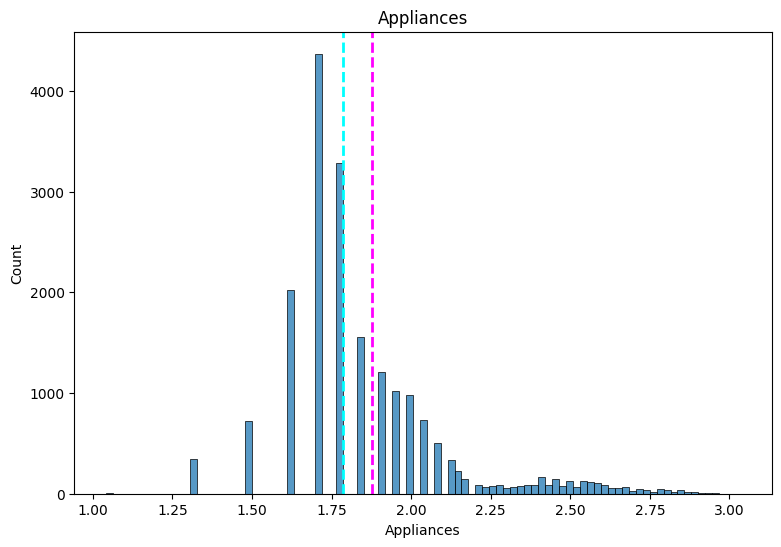

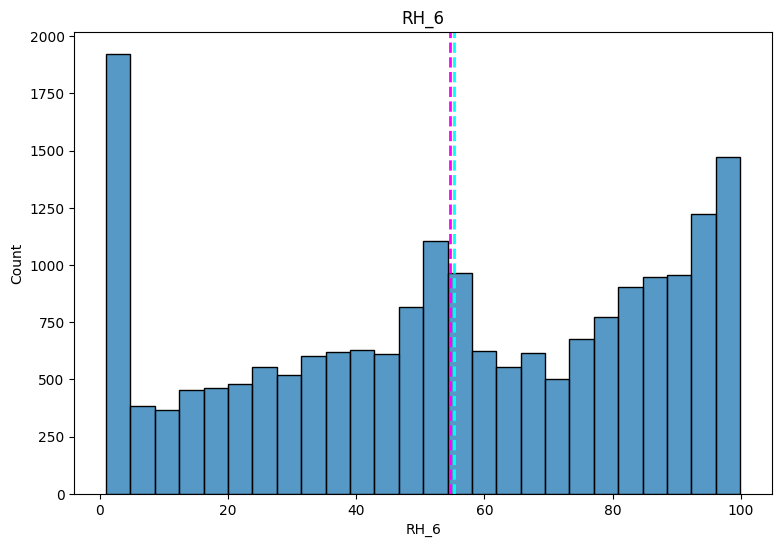

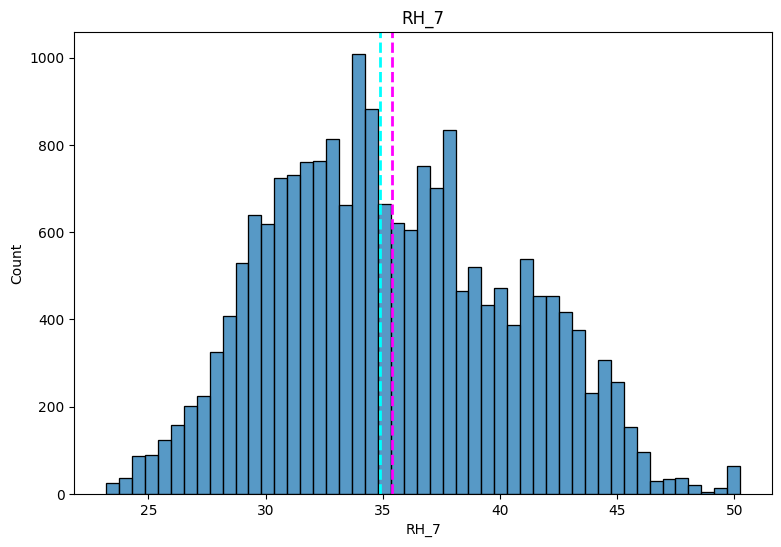

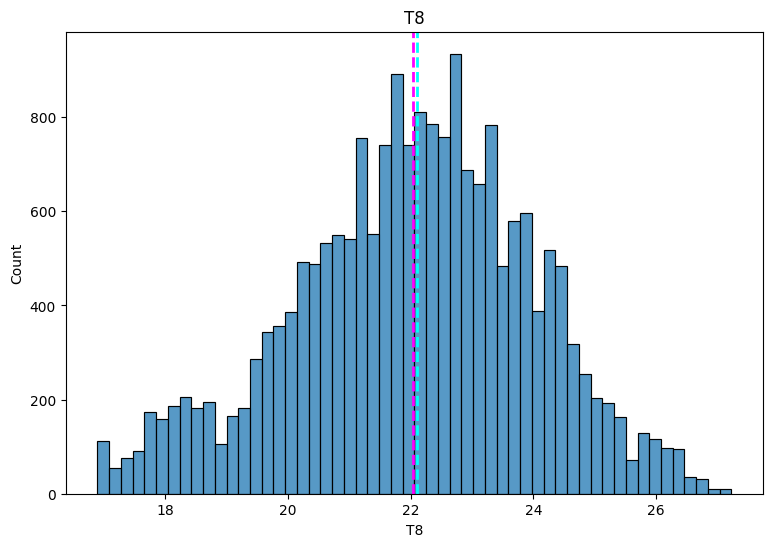

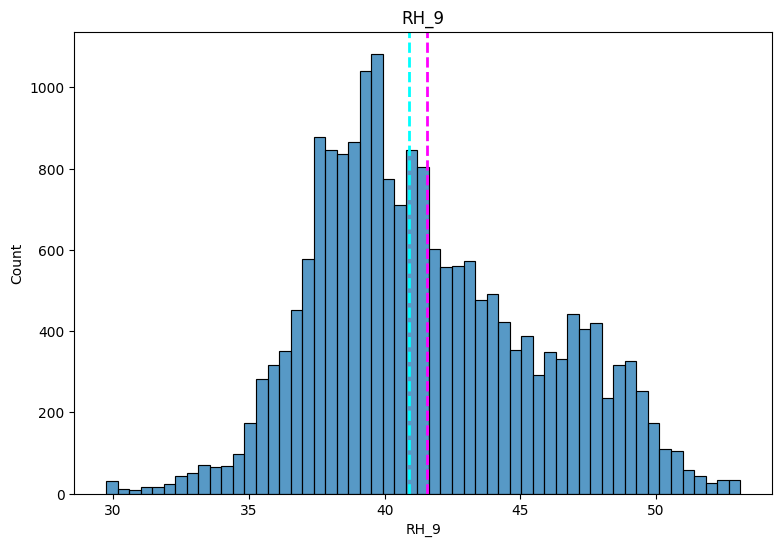

...

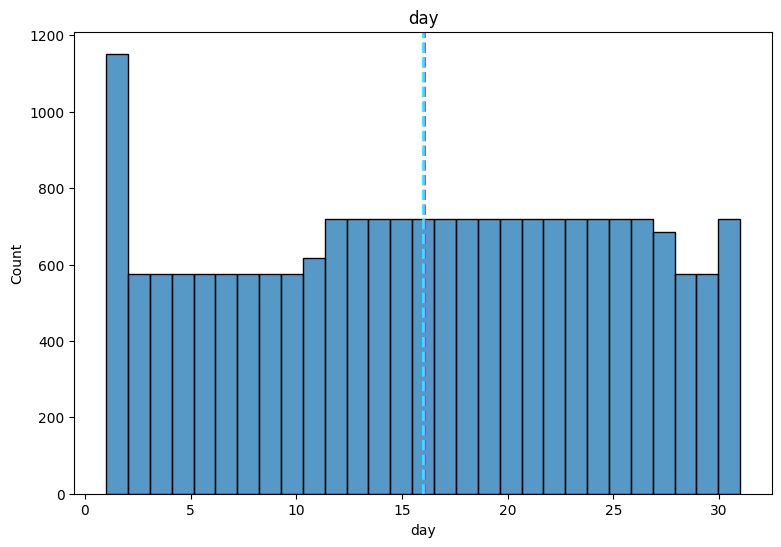

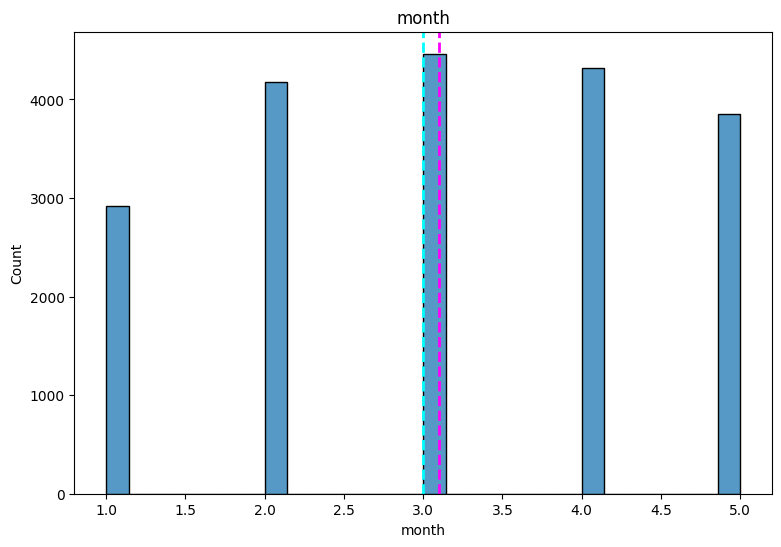

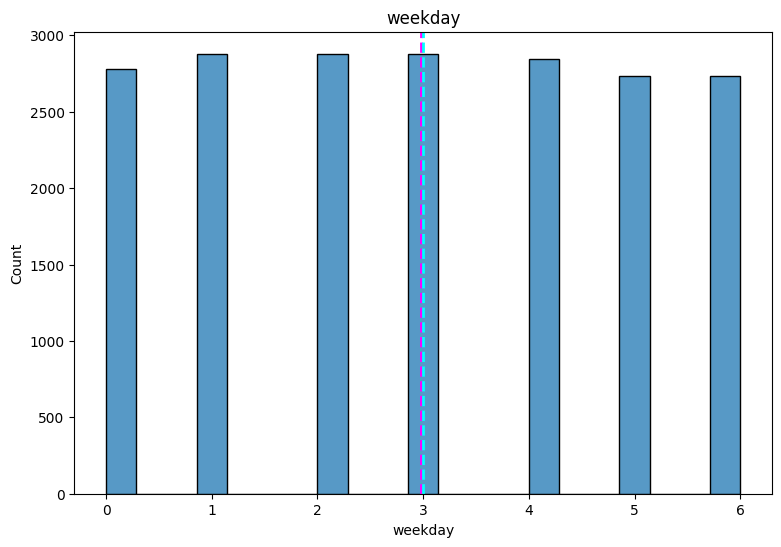

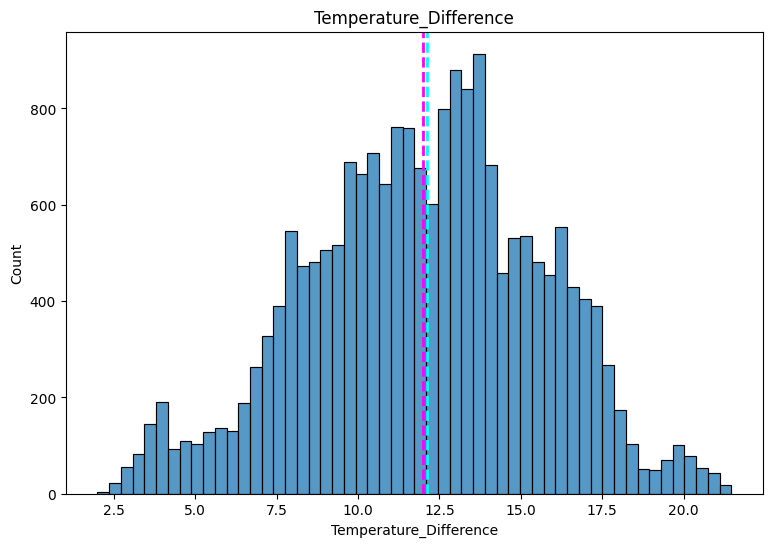

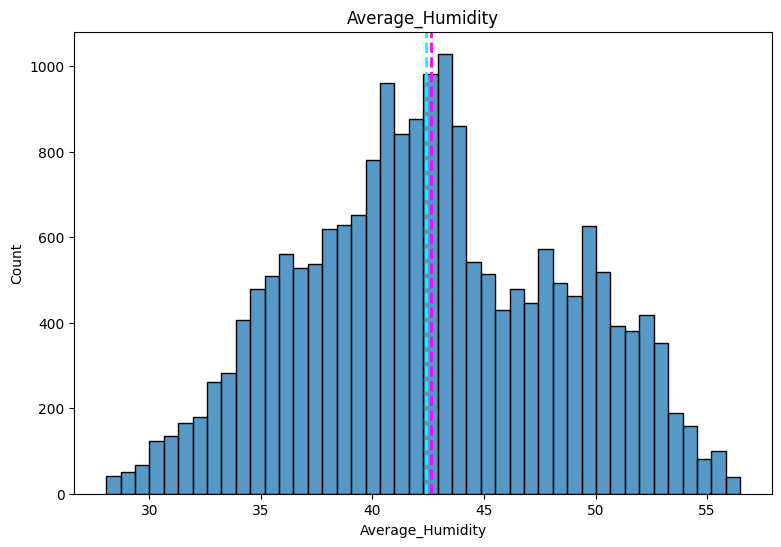

In [44]:
# check the distribution of the features after transformation
for col in df_removed.describe().columns:
  fig=plt.figure(figsize=(9,6))
  ax=fig.gca()
  feature= (df_removed[col])
  sns.histplot(df_removed[col])
  ax.axvline(feature.mean(),color='magenta', linestyle='dashed', linewidth=2)
  ax.axvline(feature.median(),color='cyan', linestyle='dashed', linewidth=2)
  ax.set_title(col)
plt.show()

###  Data Splitting and Model Trainning 

In [45]:
X=df_removed.drop('Appliances',axis=1)
y=df_removed['Appliances']

In [46]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=0)
print(X_train.shape)
print(X_test.shape)

(15788, 13)
(3947, 13)


In [47]:
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## Models  linear regressor ,lasso ,Ridge

In [48]:
#Model 
#LinearRegresseion
lr=LinearRegression()
# Fit the LinearRegression
lr.fit(X_train_scaled,y_train)
#predict the target values of train data
lr_train=lr.predict(X_train_scaled)
# Predict the target values for the test data
y_pred_lr = lr.predict(X_test_scaled)
#Evaluate the model using
mse_lr_train=mean_squared_error(y_train,lr_train)
mse_lr_test = mean_squared_error(y_test, y_pred_lr)
r2_lr_train=r2_score(y_train,lr_train)
r2_lr_test = r2_score(y_test, y_pred_lr)

print("LinearRegression Mean Squared Error:",mse_lr_test)
print("LinearRegression R^2 Score:",r2_lr_test)


##Ridge
ridge = Ridge()
# Fit the Ridge model
ridge.fit(X_train_scaled, y_train)
#predict the target values of train data
r_train=ridge.predict(X_train_scaled)
# Predict  values for the test data
y_pred_r = ridge.predict(X_test_scaled)
# Evaluate the model using metrics
mse_r_train=mean_squared_error(y_train,r_train)
mse_r_test =mean_squared_error(y_test, y_pred_r)
r2_r_train=r2_score(y_train,r_train)
r2_r_test = r2_score(y_test, y_pred_r)

print("Ridge Mean Squared Error:",mse_r_test)
print("Ridge R^2 Score:",r2_r_test)


#Lasso
lasso = Lasso()
# Fit the Lasso model on the training data
lasso.fit(X_train_scaled, y_train)
#predict the target values of train data
l_train=ridge.predict(X_train_scaled)
# Predict the target values for the test data
y_pred_l = lasso.predict(X_test_scaled)
# Evaluate the model using metrics
mse_l_train=mean_squared_error(y_train,l_train)
mse_l_test = mean_squared_error(y_test, y_pred_l)
r2_l_train=r2_score(y_train,l_train)
r2_l_test = r2_score(y_test, y_pred_l)

print("Lasso Mean Squared Error:",mse_l_test)
print("Lasso R^2 Score:",r2_l_test)

LinearRegression Mean Squared Error: 0.06882422766553949
LinearRegression R^2 Score: 0.15233381097353782
Ridge Mean Squared Error: 0.06885914950887209
Ridge R^2 Score: 0.15190369985052765
Lasso Mean Squared Error: 0.08121152227257328
Lasso R^2 Score: -0.0002329691859135341


## Model Decision Tree

In [49]:
model = DecisionTreeRegressor(random_state=42)

#fit the model
model.fit(X_train_scaled, y_train)

#predictions on the test set
y_pred = model.predict(X_test_scaled)

#evaluate the model
mse_DT = mean_squared_error(y_test, y_pred)
r2_DT = r2_score(y_test, y_pred)

print("Mean Squared Error: ", mse_DT)
print("R-squared: ", r2_DT)

Mean Squared Error:  0.03802898307663927
R-squared:  0.5316201249103556


##  MODEL XGBOOST

In [50]:
xgb = XGBRegressor(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=6,
    random_state=42
)

xgb.fit(X_train, y_train)

# Prediction
y_pred_xgb = xgb.predict(X_test)

# Evaluation
print("XGBoost")
print("R2 Score :", r2_score(y_test, y_pred_xgb))
print("MSE :", mean_squared_error(y_test, y_pred_xgb))

XGBoost
R2 Score : 0.5731750163190383
MSE : 0.03465503311384481


## Model GradientBoostingRegressor

In [51]:
# Model
gbr = GradientBoostingRegressor(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    random_state=42
)

# Train
gbr.fit(X_train, y_train)

# Prediction
y_pred_gbr = gbr.predict(X_test)

# Evaluation
print("Gradient Boosting Regressor")
print("R2 Score :", r2_score(y_test, y_pred_gbr))
print("MSE :", mean_squared_error(y_test, y_pred_gbr))

Gradient Boosting Regressor
R2 Score : 0.4012143733527418
MSE : 0.04861696599996996


## Model RandomForestRegressor

In [52]:
# ML Model - 3 Implementation
rf = RandomForestRegressor(random_state=42)

# Fit the Algorithm
rf.fit(X_train_scaled, y_train)

# Predict on the model
y_pred = rf.predict(X_test_scaled)

#evaluate the model
mse_rf = mean_squared_error(y_test, y_pred)
r2_rf = r2_score(y_test, y_pred)

print("Mean squared error: ", mse_rf)
print("R-squared: ", r2_rf)

Mean squared error:  0.023916243178073057
R-squared:  0.7054381662064322


## Model LGBMRegressor

In [53]:
lgbm = LGBMRegressor(random_state=0)

# Fit the Algorithm
lgbm.fit(X_train_scaled, y_train)

# Predict on the model
y_pred = lgbm.predict(X_test_scaled)

#evaluate the model
mse_lgbm = mean_squared_error(y_test, y_pred)
r2_lgbm = r2_score(y_test, y_pred)

print("Mean Squared Error: ", mse_lgbm)
print("R-squared: ", r2_lgbm)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001190 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2189
[LightGBM] [Info] Number of data points in the train set: 15788, number of used features: 13
[LightGBM] [Info] Start training from score 1.875112
Mean Squared Error:  0.035142484222133674
R-squared:  0.567171377232699


## Model Performance Comparison

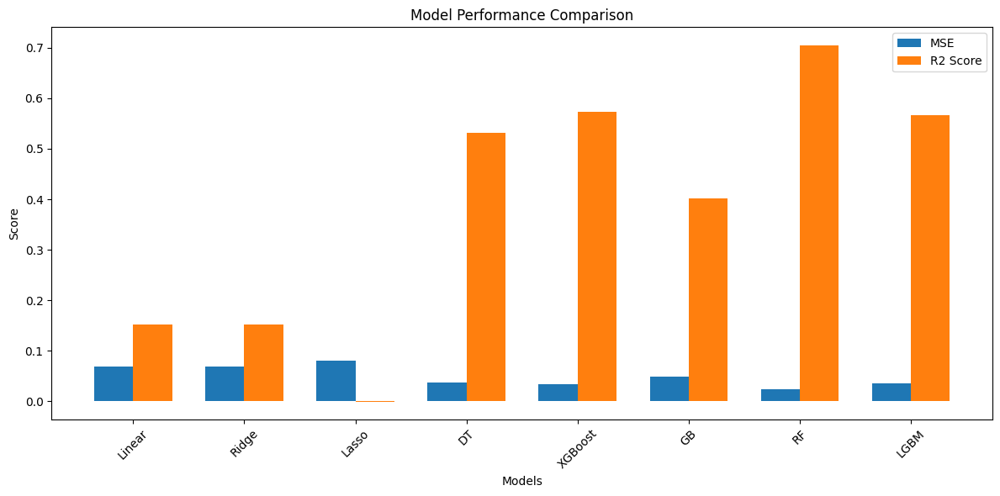

In [54]:
models = ['Linear','Ridge','Lasso','DT','XGBoost','GB','RF','LGBM']

r2_scores = [
    r2_lr_test,
    r2_r_test,
    r2_l_test,
    r2_DT,
    r2_score(y_test, y_pred_xgb),
    r2_score(y_test, y_pred_gbr),
    r2_rf,
    r2_lgbm
]

mse_scores = [
    mse_lr_test,
    mse_r_test,
    mse_l_test,
    mse_DT,
    mean_squared_error(y_test, y_pred_xgb),
    mean_squared_error(y_test, y_pred_gbr),
    mse_rf,
    mse_lgbm
]

x = np.arange(len(models))
width = 0.35

plt.figure(figsize=(12,6))

plt.bar(x - width/2, mse_scores, width, label='MSE')
plt.bar(x + width/2, r2_scores, width, label='R2 Score')

plt.title("Model Performance Comparison")
plt.xlabel("Models")
plt.ylabel("Score")
plt.xticks(x, models, rotation=45)
plt.legend()

plt.tight_layout()
plt.show()

## Cross Validation and Hyperparameter tunning

In [55]:
param_grid = {
    'n_estimators': [100, 150, 200],
    'max_depth': [10, 20, 30, None],
    'min_samples_leaf': [1, 2, 5],
    'max_features': ['sqrt', 'log2'],
    'bootstrap': [True, False]
}

grid_search = GridSearchCV(rf, param_grid, cv=3)
grid_search.fit(X_train_scaled, y_train)
print('Best parameters:', grid_search.best_params_)

# Fit the Algorithm
best_rf_model = grid_search.best_estimator_
best_rf_model.fit(X_train_scaled, y_train)

#Predict the train model
rf_train=best_rf_model.predict(X_train_scaled)

# Predict on the model
y_pred = best_rf_model.predict(X_test_scaled)

#evaluate the metric score
mse_rf_train = mean_squared_error(y_train, rf_train)
mse_rf_test = mean_squared_error(y_test, y_pred)
r2_rf_train = r2_score(y_train, rf_train)
r2_rf_test = r2_score(y_test, y_pred)


print('Mean Squared Error:', mse_rf_test)
print('R2 Score:', r2_rf_test)

Best parameters: {'bootstrap': False, 'max_depth': 30, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'n_estimators': 200}
Mean Squared Error: 0.021424729799589367
R2 Score: 0.7361246224455218


## Feature Importance

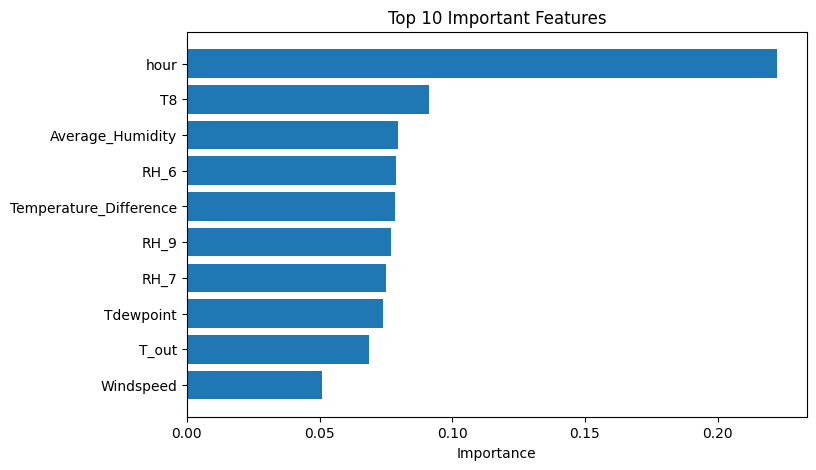

In [56]:
importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': best_rf_model.feature_importances_
})

importance = importance.sort_values(
    by='Importance',
    ascending=False
).head(10)

plt.figure(figsize=(8,5))
plt.barh(importance['Feature'], importance['Importance'])
plt.title("Top 10 Important Features")
plt.xlabel("Importance")
plt.gca().invert_yaxis()
plt.show()

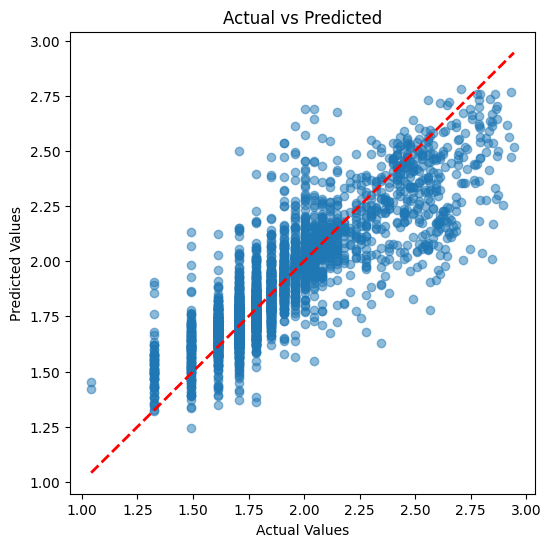

In [57]:

plt.figure(figsize=(6,6))

plt.scatter(y_test, y_pred, alpha=0.5)

# Perfect prediction line
plt.plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    'r--',
    linewidth=2
)

plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Actual vs Predicted")

plt.show()

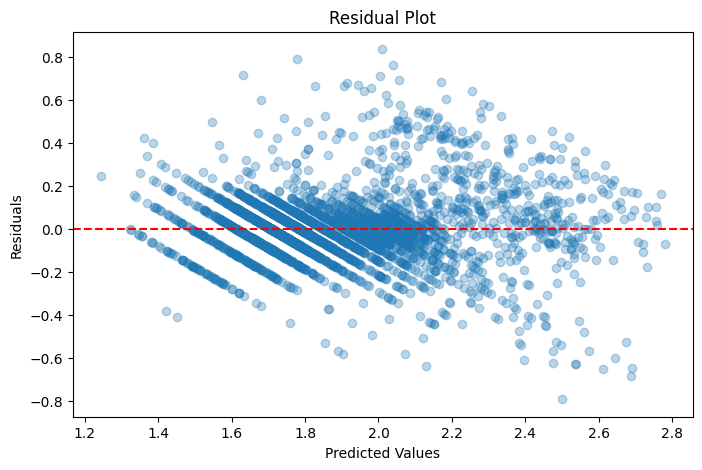

In [58]:

errors = y_test - y_pred

plt.figure(figsize=(8,5))
plt.scatter(y_pred, errors, alpha=0.3)

plt.axhline(y=0, color='red', linestyle='--')

plt.xlabel("Predicted Values")
plt.ylabel("Residuals")
plt.title("Residual Plot")

plt.show()

## Shap Analysis

In [59]:
explainer = shap.TreeExplainer(best_rf_model)

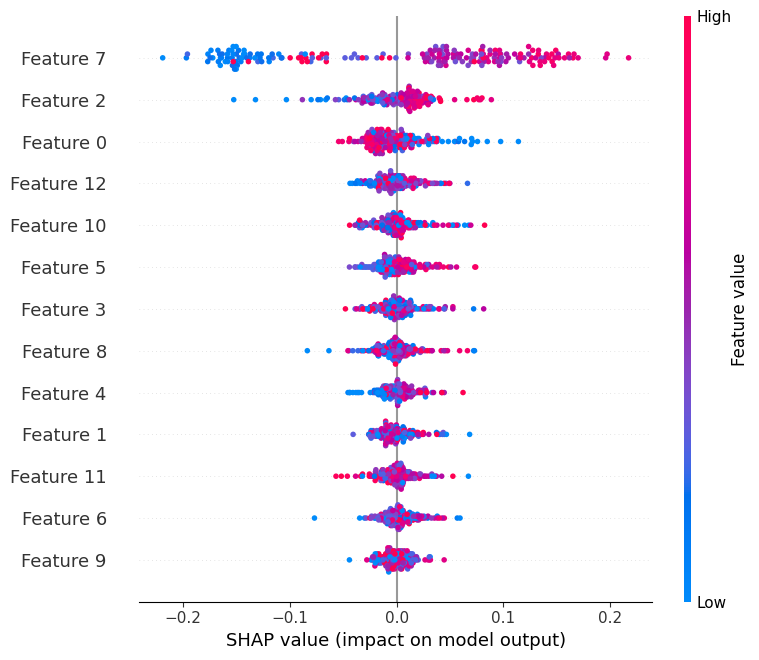

In [60]:
X_sample = X_test_scaled[:200]

shap_values = explainer.shap_values(X_sample)

shap.summary_plot(shap_values, X_sample)

In [61]:
# Save model
joblib.dump(best_rf_model, 'appliance_energy_rf_model.pkl')

print("Model Saved Successfully")

Model Saved Successfully


## Conclusion
Multiple machine learning models were developed and evaluated for appliance energy consumption prediction.

Feature engineering, log transformation, and hyperparameter tuning improved model performance.

The tuned Random Forest Regressor achieved the best results with R² = 0.736 and MSE = 0.0214.

The model can support smart energy management and efficient household energy utilization. 